In [1]:
import sys
sys.path.append('../saerch')

from topk_sae import FastAutoencoder
import numpy as np
import torch
from tqdm import tqdm
import os
from torch.utils.data import DataLoader, TensorDataset

## Scaling laws

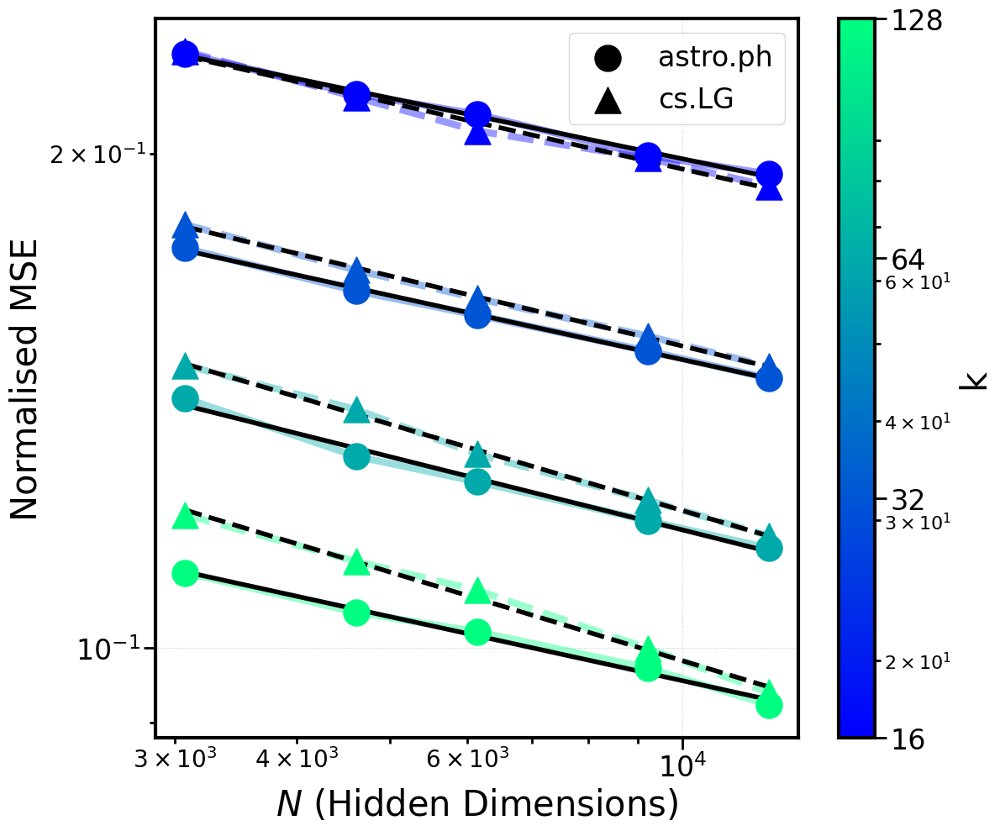

In [283]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm

# Parameters
base_font_size = 24
title_font_size = base_font_size * 1.5
label_font_size = base_font_size * 1.25
legend_font_size = base_font_size
tick_font_size = base_font_size
minor_tick_font_size = tick_font_size - 4

base_line_width = 6
s = 500
fit_line_width = base_line_width
data_line_width = base_line_width
box_line_width = 3
tick_width = 2

# Data
k_values = [16, 32, 64, 128]
n_values = [3072, 4608, 6144, 9216, 12288]
mse_values = {
    16: [0.2300, 0.2174, 0.2113, 0.1994, 0.1943],
    32: [0.1751, 0.1649, 0.1594, 0.1516, 0.1459],
    64: [0.1419, 0.1308, 0.1262, 0.1195, 0.1150],
    128: [0.1111, 0.1051, 0.1023, 0.0972, 0.0923]
}

mse_values_csLG = {
    16: [0.2308, 0.2164, 0.2064, 0.1986, 0.1910],
    32: [0.1810, 0.1698, 0.1632, 0.1548, 0.1483],
    64: [0.1486, 0.1397, 0.1312, 0.1230, 0.1170],
    128: [0.1205, 0.1129, 0.1084, 0.0999, 0.0939]
}

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Create logarithmic colormap
cmap = plt.get_cmap('winter')
norm = LogNorm(vmin=min(k_values), vmax=max(k_values))

import numpy as np
from scipy import stats

def calculate_fit_info(x, y):
    log_x = np.log10(x)
    log_y = np.log10(y)
    
    # Perform linear regression
    slope, intercept, r_value, _, _ = stats.linregress(log_x, log_y)
    
    # Calculate R-squared
    r_squared = r_value**2
    
    # Calculate the coefficient (10^intercept)
    coefficient = 10**intercept
    
    return slope, coefficient, r_squared

# Plot data points and connecting lines
for k in k_values:
    x = n_values
    y_astro = mse_values[k]
    y_csLG = mse_values_csLG[k]
    color = cmap(norm(k))
    
    # Plot scatter points for astro.ph
    ax.scatter(x, y_astro, c=[color], s=s, zorder=3, marker='o')
    
    # Plot scatter points for cs.LG
    ax.scatter(x, y_csLG, c=[color], s=s, zorder=3, marker='^')
    
    # Connect points with lines
    ax.plot(x, y_astro, color=color, linewidth=data_line_width, zorder=2, linestyle='-', alpha=0.4)
    ax.plot(x, y_csLG, color=color, linewidth=data_line_width, zorder=2, linestyle='--', alpha=0.4)
    
    #Fit lines
    for y, linestyle in [(y_astro, '-'), (y_csLG, '--')]:
        log_x = np.log10(x)
        log_y = np.log10(y)
        coeffs = np.polyfit(log_x, log_y, 1)
        poly = np.poly1d(coeffs)
        
        # Plot the line of best fit
        x_line = np.logspace(np.log10(min(x)), np.log10(max(x)), 100)
        ax.plot(x_line, 10**poly(np.log10(x_line)), color='black', linestyle=linestyle,
                linewidth=fit_line_width-2, alpha=1.0)

    # for dataset, data, linestyle in [("astro.ph", mse_values[k], '-'), ("cs.LG", mse_values_csLG[k], '--')]:
    #     slope, coefficient, r_squared = calculate_fit_info(n_values, data)
    #     print(f"k={k}, {dataset}:")
    #     print(f"  Slope (power law exponent): {slope:.4f}")
    #     print(f"  Coefficient: {coefficient:.4e}")
    #     print(f"  R-squared: {r_squared:.4f}")
    #     print()

    #     # Plot the line of best fit
    #     x_line = np.logspace(np.log10(min(x)), np.log10(max(x)), 100)
    #     ax.plot(x_line, 10**poly(np.log10(x_line)), color='black', linestyle=linestyle,
    #             linewidth=fit_line_width-2, alpha=1.0)

# Customize the plot
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('$N$ (Hidden Dimensions)', fontsize=label_font_size)
ax.set_ylabel('Normalised MSE', fontsize=label_font_size)
# ax.set_title('$L(N, k)$', fontsize=title_font_size)
ax.grid(True, linestyle=':', alpha=0.7)

# Set font size and width for tick labels and marks
ax.tick_params(axis='both', which='major', labelsize=tick_font_size, width=tick_width, length=10)
ax.tick_params(axis='both', which='minor', labelsize=minor_tick_font_size, width=tick_width, length=5)

# Make the bounding box thicker
for spine in ax.spines.values():
    spine.set_linewidth(box_line_width)

# Add colorbar with logarithmic scale
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('k', fontsize=label_font_size)

# Set font size and width for colorbar ticks
cbar.ax.tick_params(which='both', labelsize=minor_tick_font_size-4, width=tick_width, length=5)
cbar.ax.tick_params(which='major', length=10)

# Make colorbar border thicker
cbar.outline.set_linewidth(box_line_width)

# Adjust colorbar ticks to show actual k values
cbar.set_ticks(k_values)
cbar.set_ticklabels(k_values)

# Manually set font size for major ticks (k values)
for t in cbar.ax.get_yticklabels():
    t.set_fontsize(tick_font_size)

# Add legend for datasets only
ax.scatter([], [], c='black', s=s, marker='o', label='astro.ph')
ax.scatter([], [], c='black', s=s, marker='^', label='cs.LG')
ax.legend(fontsize=legend_font_size, loc='upper right')

# Adjust layout and display
plt.tight_layout()

# Save figure
plt.savefig('../output/l_n_k_scaling.pdf', dpi=300, bbox_inches='tight')

plt.show()

In [284]:
import wandb
import pandas as pd
from tqdm import tqdm

# Authenticate to Weights & Biases
api_key = "35fb046bd65a7520e1e7f5e5607fd43b80d861d0"
wandb.login(key=api_key)

# Set your W&B username and project name
entity = "charlieoneill"
project = "saerch"

# Initialize the W&B API
api = wandb.Api()

# Get all runs for the specified project
runs = api.runs(f"{entity}/{project}")

# Create an empty list to store the data
data = []

# Iterate over each run and download the metrics
for run in tqdm(runs):
    history = run.scan_history()
    for row in history:
        row['run_id'] = run.id
        row['run_name'] = run.name
        data.append(row)

# Convert the data to a pandas DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv("saerch_project_metrics.csv", index=False)

print("Data download complete and saved to saerch_project_metrics.csv.")

# Load the data
df = pd.read_csv("saerch_project_metrics.csv")
df.head()

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/charlesoneill/.netrc
100%|██████████| 68/68 [04:08<00:00,  3.66s/it]


Data download complete and saved to saerch_project_metrics.csv.


/var/folders/wg/cdt_cw_5265_z_gwnxlf0tv80000gn/T/ipykernel_75753/1807967775.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wg/cdt_cw_5265_z_gwnxlf0tv80000gn/T/ipykernel_75753/1807967775.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/wg/cdt_cw_5265_z_gwnxlf0tv80000gn/T/ipykernel_75753/1807967775.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

$y = 3.84 \times x^{-0.11}$
$y = 5.25 \times x^{-0.13}$
$y = 8.03 \times x^{-0.16}$
$y = 2.8 \times x^{-0.13}$
k=16:
  Coefficient (a): 3.8373e+00
  Power law exponent (b): -0.1106
  R-squared: 0.9756

k=32:
  Coefficient (a): 5.2458e+00
  Power law exponent (b): -0.1320
  R-squared: 0.9317

k=64:
  Coefficient (a): 8.0262e+00
  Power law exponent (b): -0.1579
  R-squared: 0.9919

k=128:
  Coefficient (a): 2.7980e+00
  Power law exponent (b): -0.1257
  R-squared: 0.9708



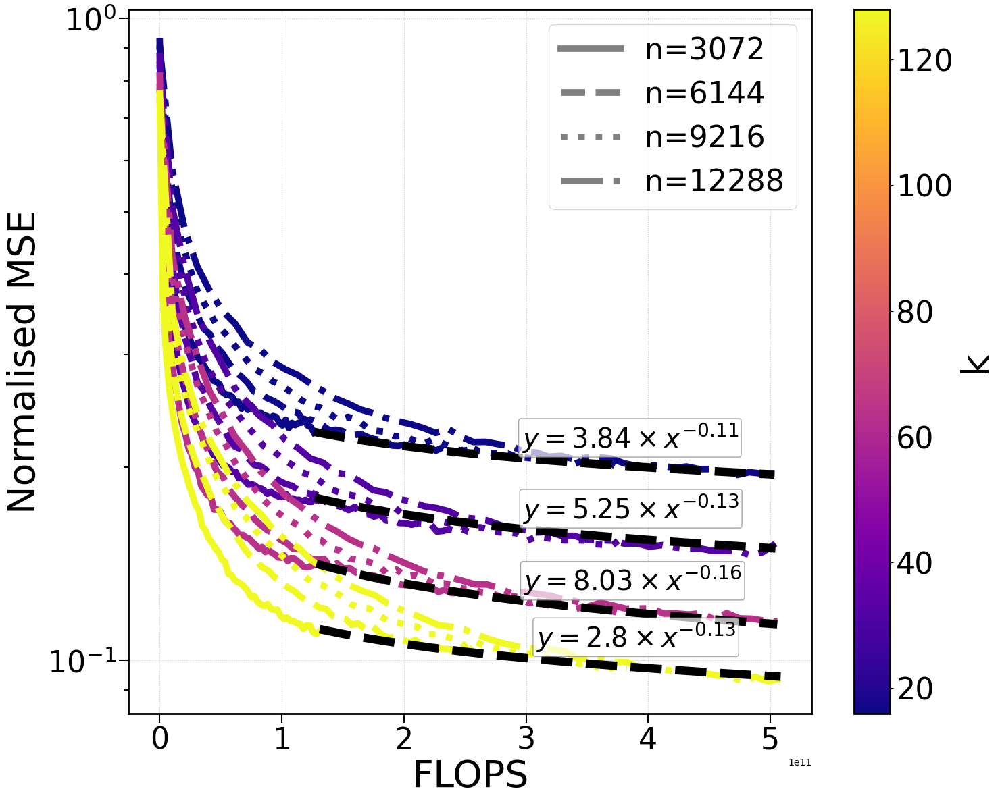

In [287]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from scipy import optimize

# Assuming df is your DataFrame
# If it's not, you'll need to create it from the string you provided

# Parameters
base_font_size = 32
title_font_size = base_font_size * 1.5
label_font_size = base_font_size * 1.25
legend_font_size = base_font_size
tick_font_size = base_font_size
line_width = 7
box_line_width = 2
tick_width = 1.5
fitted_line_width = 9  # Slightly thicker than other lines

k_list = [16, 32, 64, 128]
n_list = [3072, 6144, 9216, 12288]
d_model = 1536  # Assuming this is constant for all runs

# Function to calculate FLOPS
def calculate_flops(n_dirs, d_model, k):
    return 2 * n_dirs * d_model + n_dirs * np.log2(k) + 2 * d_model * k - 2 * d_model

# Set up the plot
fig, ax = plt.subplots(figsize=(15, 12))

# Create colormap
cmap = plt.get_cmap('plasma')
norm = Normalize(vmin=min(k_list), vmax=max(k_list))

# Define line styles and markers for different n values
line_styles = {3072: '-', 4608: '-', 6144: '--', 9216: ':', 12288: '-.'}
markers = {3072: None, 4608: 'o', 6144: None, 9216: 'None', 12288: None}

# Dictionary to store final loss values for each k
final_losses = {k: [] for k in k_list}

# Plot data
for k in k_list:
    color = cmap(norm(k))
    for n in n_list:
        run_name = f"{k}_{n}_{k*2}_auxk"
        df_run = df[df.run_name == run_name]
        
        if not df_run.empty:
            # Calculate FLOPS for this configuration
            flops = calculate_flops(n, d_model, k)
            
            # Calculate cumulative FLOPS
            df_run['cumulative_flops'] = df_run['step'] * flops
            
            # Uniformly sample 100 points
            num_points = len(df_run)
            if num_points > 100:
                indices = np.linspace(0, num_points - 1, 50, dtype=int)
                df_sampled = df_run.iloc[indices]
            else:
                df_sampled = df_run
            
            ax.plot(df_sampled.cumulative_flops, df_sampled.reconstruction_loss,
                    color=color, linestyle=line_styles[n], linewidth=line_width,
                    label=f'k={k}, n={n}', marker=markers[n], markersize=12, markeredgewidth=3)
            
            # Store final loss value
            flops_to_add = df_sampled.cumulative_flops.iloc[-1]
            final_losses[k].append((float(flops_to_add), float(df_sampled.reconstruction_loss.iloc[-1])))

# Dictionary to store fitted line equations
fitted_equations = {}

# Function to fit: y = a * x^b
def power_law(x, a, b):
    return a * np.power(x, b)

# Fit curves and plot for each k
for k, losses in final_losses.items():
    x = np.array([flops for flops, _ in losses])
    y = np.array([loss for _, loss in losses])
    
    # Fit the power law function
    params, _ = optimize.curve_fit(power_law, x, y)
    a, b = params
    
    # Generate points for the fitted curve
    x_fit = np.linspace(min(x), max(x), 1000)
    y_fit = power_law(x_fit, a, b)
    
    line, = ax.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=fitted_line_width)

    # Store the equation of the fitted curve
    # Convert scientific notation to a more readable format
    a = f"{a:.2e}" #str(a).split('e')[0][:3]
    #equation = f"$y = {float(a)} \\times x^{b:.2f}$"
    # Format the equation with proper exponent handling
    b_abs = abs(b)
    b_sign = '-' if b < 0 else ''
    equation = f"$y = {float(a)} \\times x^{{{b_sign}{b_abs:.2f}}}$"
    print(equation)
    fitted_equations[k] = equation
    
    # Add text annotation above the line
    midpoint = len(x_fit) // 2
    ax.annotate(equation, (x_fit[midpoint]+7e10, y_fit[midpoint]+0.0007), xytext=(0, 5), 
                textcoords='offset points', ha='center', va='bottom',
                bbox=dict(boxstyle='round,pad=0.1', fc='white', ec='gray', alpha=0.7),
                fontsize=legend_font_size * 0.9)
    
for k, losses in final_losses.items():
    x = np.array([flops for flops, _ in losses])
    y = np.array([loss for _, loss in losses])
    
    # Fit the power law function
    params, covariance = optimize.curve_fit(power_law, x, y)
    a, b = params
    
    # Calculate R-squared
    residuals = y - power_law(x, a, b)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)
    
    print(f"k={k}:")
    print(f"  Coefficient (a): {a:.4e}")
    print(f"  Power law exponent (b): {b:.4f}")
    print(f"  R-squared: {r_squared:.4f}")
    print()

# Customize the plot
ax.set_xlabel('FLOPS', fontsize=label_font_size)
ax.set_ylabel('Normalised MSE', fontsize=label_font_size)
ax.grid(True, linestyle=':', alpha=0.7)

# Set font size and width for tick labels and marks
ax.tick_params(axis='both', which='major', labelsize=tick_font_size, width=tick_width, length=10)
ax.tick_params(axis='both', which='minor', labelsize=tick_font_size-2, width=tick_width, length=5)

# Make the bounding box thicker
for spine in ax.spines.values():
    spine.set_linewidth(box_line_width)

# Add colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('k', fontsize=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)

# Make colorbar border thicker
cbar.outline.set_linewidth(box_line_width)

# Set y-axis to log scale
ax.set_yscale('log')

# Create a custom legend
legend_elements = [
    plt.Line2D([0], [0], color='gray', linestyle='-', linewidth=line_width, label=f'n=3072'),
    #plt.Line2D([0], [0], color='gray', linestyle=':', linewidth=line_width, label=f'n=4608', marker='o', markersize=10, markeredgewidth=2),
    plt.Line2D([0], [0], color='gray', linestyle='--', linewidth=line_width, label=f'n=6144'),
    plt.Line2D([0], [0], color='gray', linestyle=':', linewidth=line_width, label=f'n=9216', markersize=10, markeredgewidth=2),
    plt.Line2D([0], [0], color='gray', linestyle='-.', linewidth=line_width, label=f'n=12288'),
]

ax.legend(handles=legend_elements, fontsize=legend_font_size, loc='upper right')

plt.tight_layout()
plt.savefig('../output/reconstruction_loss_plot_flops.pdf', dpi=300, bbox_inches='tight')
plt.show()

## Load models

In [192]:
path_16 = '../models/16_3072_24_auxk_epoch_50.pth'
path_32 = '../models/32_6144_48_auxk_epoch_50.pth'
path_64 = '../models/64_9216_128_auxk_epoch_50.pth'

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '16': {
        'path': path_16,
        'd_model': 1536,
        'n_dirs': 3072,
        'k': 16,
        'auxk': 24
    },
    '32': {
        'path': path_32,
        'd_model': 1536,
        'n_dirs': 6144,
        'k': 32,
        'auxk': 48
    },
    '64': {
        'path': path_64,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

In [193]:
models

{'16': FastAutoencoder(
   (encoder): Linear(in_features=1536, out_features=3072, bias=False)
   (decoder): Linear(in_features=3072, out_features=1536, bias=False)
 ),
 '32': FastAutoencoder(
   (encoder): Linear(in_features=1536, out_features=6144, bias=False)
   (decoder): Linear(in_features=6144, out_features=1536, bias=False)
 ),
 '64': FastAutoencoder(
   (encoder): Linear(in_features=1536, out_features=9216, bias=False)
   (decoder): Linear(in_features=9216, out_features=1536, bias=False)
 )}

In [194]:
# Get the decoder matrices
decoders = {}
for key, model in models.items():
    decoders[key] = model.decoder.weight.data.cpu().numpy()

decoders['16'].shape, decoders['32'].shape, decoders['64'].shape

((1536, 3072), (1536, 6144), (1536, 9216))

In [44]:
import numpy as np
from scipy.spatial.distance import cosine

def get_top_and_bottom_similar_columns(sae1, sae2, n=10):
    """
    Find the top n and bottom n most similar column vectors between two SAE decoders based on cosine similarity.
    
    :param sae1: Decoder matrix of the first SAE
    :param sae2: Decoder matrix of the second SAE
    :param n: Number of top and bottom similar pairs to return (default: 10)
    :return: Two lists of tuples containing (similarity, index1, index2) for top and bottom similarities
    """
    # Normalize the columns of both matrices
    sae1_norm = sae1 / np.linalg.norm(sae1, axis=0, keepdims=True)
    sae2_norm = sae2 / np.linalg.norm(sae2, axis=0, keepdims=True)
    
    # Compute cosine similarities between all pairs of columns
    similarity_matrix = np.dot(sae1_norm.T, sae2_norm)
    
    # Get the indices of the top n and bottom n similarities
    top_indices = np.unravel_index(np.argsort(similarity_matrix.ravel())[-n:], similarity_matrix.shape)
    bottom_indices = np.unravel_index(np.argsort(similarity_matrix.ravel())[:n], similarity_matrix.shape)
    
    # Create lists of (similarity, index1, index2) tuples for top and bottom similarities
    top_similarities = []
    bottom_similarities = []
    
    for i, j in zip(top_indices[0], top_indices[1]):
        similarity = similarity_matrix[i, j]
        top_similarities.append((similarity, i, j))
    
    for i, j in zip(bottom_indices[0], bottom_indices[1]):
        similarity = similarity_matrix[i, j]
        bottom_similarities.append((similarity, i, j))
    
    # Sort in descending order of similarity for top similarities
    top_similarities.sort(reverse=True)
    # Sort in ascending order of similarity for bottom similarities
    bottom_similarities.sort()
    
    return top_similarities, bottom_similarities

# Example usage
# Assuming decoders is a dictionary containing the decoder matrices
decoders = {
    '16': decoders['16'],
    '32': decoders['32'],
    '64': decoders['64']
}

def print_similarities(top_sim, bottom_sim, sae1_name, sae2_name):
    print(f"\nTop 10 similar columns between {sae1_name} and {sae2_name}:")
    for similarity, idx1, idx2 in top_sim:
        print(f"Similarity: {similarity:.4f}, {sae1_name} column: {idx1}, {sae2_name} column: {idx2}")
    
    print(f"\nBottom 10 similar columns between {sae1_name} and {sae2_name}:")
    for similarity, idx1, idx2 in bottom_sim:
        print(f"Similarity: {similarity:.4f}, {sae1_name} column: {idx1}, {sae2_name} column: {idx2}")

# Compare SAE16 and SAE32
top_16_32, bottom_16_32 = get_top_and_bottom_similar_columns(decoders['16'], decoders['32'])
print_similarities(top_16_32, bottom_16_32, 'SAE16', 'SAE32')

# Compare SAE32 and SAE64
top_32_64, bottom_32_64 = get_top_and_bottom_similar_columns(decoders['32'], decoders['64'])
print_similarities(top_32_64, bottom_32_64, 'SAE32', 'SAE64')

# Compare SAE16 and SAE64
top_16_64, bottom_16_64 = get_top_and_bottom_similar_columns(decoders['16'], decoders['64'])
print_similarities(top_16_64, bottom_16_64, 'SAE16', 'SAE64')


Top 10 similar columns between SAE16 and SAE32:
Similarity: 0.9960, SAE16 column: 2645, SAE32 column: 4236
Similarity: 0.9960, SAE16 column: 549, SAE32 column: 3945
Similarity: 0.9960, SAE16 column: 2537, SAE32 column: 3013
Similarity: 0.9955, SAE16 column: 2210, SAE32 column: 6100
Similarity: 0.9952, SAE16 column: 774, SAE32 column: 5204
Similarity: 0.9952, SAE16 column: 292, SAE32 column: 2239
Similarity: 0.9951, SAE16 column: 1569, SAE32 column: 3932
Similarity: 0.9951, SAE16 column: 1986, SAE32 column: 4749
Similarity: 0.9950, SAE16 column: 2958, SAE32 column: 4011
Similarity: 0.9948, SAE16 column: 2398, SAE32 column: 2531

Bottom 10 similar columns between SAE16 and SAE32:
Similarity: -0.7161, SAE16 column: 497, SAE32 column: 115
Similarity: -0.5957, SAE16 column: 1631, SAE32 column: 6031
Similarity: -0.5893, SAE16 column: 1534, SAE32 column: 17
Similarity: -0.5741, SAE16 column: 198, SAE32 column: 1694
Similarity: -0.5691, SAE16 column: 1086, SAE32 column: 1141
Similarity: -0.56

In [49]:
import numpy as np
import plotly.graph_objects as go
from umap import UMAP
from sklearn.preprocessing import StandardScaler
import json

# Assuming decoders is a dictionary containing the decoder matrices
decoders = {
    '16': decoders['16'],
    '32': decoders['32'],
    '64': decoders['64']
}

def load_feature_labels(filename):
    with open(filename, 'r') as f:
        data = json.load(f)
    return {item['index']: item['label'] for item in data}

def prepare_data(decoders):
    all_columns = []
    labels = []
    sizes = []
    hover_texts = []
    
    feature_labels = {
        '16': load_feature_labels('sae_data/feature_analysis_results_16.json'),
        '32': load_feature_labels('sae_data/feature_analysis_results_32.json'),
        '64': load_feature_labels('sae_data/feature_analysis_results_64.json')
    }
    
    for key, matrix in decoders.items():
        columns = matrix.T  # Transpose to get column vectors
        all_columns.append(columns)
        labels.extend([f'SAE{key}'] * columns.shape[0])
        sizes.extend([key] * columns.shape[0])
        hover_texts.extend([f"SAE{key} - Feature {i}: {feature_labels[key].get(i, 'N/A')}" 
                            for i in range(columns.shape[0])])
    
    all_columns = np.vstack(all_columns)
    return all_columns, labels, sizes, hover_texts

def plot_umap(embedding, labels, sizes, hover_texts, filename='decoder_umap.html'):
    colors = {'SAE16': '#1f77b4', 'SAE32': '#ff7f0e', 'SAE64': '#2ca02c'}
    
    fig = go.Figure()
    
    for sae in ['SAE16', 'SAE32', 'SAE64']:
        mask = np.array(labels) == sae
        fig.add_trace(go.Scattergl(
            x=embedding[mask, 0],
            y=embedding[mask, 1],
            mode='markers',
            name=sae,
            marker=dict(
                color=colors[sae],
                size=5,
                opacity=0.7
            ),
            text=[text for text, label in zip(hover_texts, labels) if label == sae],
            hoverinfo='text'
        ))
    
    fig.update_layout(
        title='UMAP Projection of Decoder Column Vectors',
        xaxis_title='UMAP1',
        yaxis_title='UMAP2',
        legend_title='Decoder Size',
        font=dict(size=12),
        hovermode='closest',
        width=1000,
        height=800
    )
    
    fig.show()

# Prepare the data
all_columns, labels, sizes, hover_texts = prepare_data(decoders)

# Normalize the data
scaler = StandardScaler()
normalized_data = scaler.fit_transform(all_columns)

# Perform UMAP
umap_model = UMAP(n_neighbors=100, n_components=2, random_state=42)
embedding = umap_model.fit_transform(normalized_data)

# Plot the results
plot_umap(embedding, labels, sizes, hover_texts)

print("UMAP visualization has been saved as 'decoder_umap.html'")

/Users/charlesoneill/miniconda3/envs/saerch/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP visualization has been saved as 'decoder_umap.html'


In [16]:
# Get all the indices and values across abstracts and save
batch_size = 1024

# Load abstract embeddings
abstract_embeddings = np.load("../data/vector_store/abstract_embeddings.npy")
abstract_embeddings = abstract_embeddings.astype(np.float32)

# Create a DataLoader for efficient batching
dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

for key, ae in models.items():
    k = int(key)

    # Prepare arrays to store results
    num_abstracts = len(abstract_embeddings)
    topk_indices = np.zeros((num_abstracts, k), dtype=np.int64)
    topk_values = np.zeros((num_abstracts, k), dtype=np.float32)

    # Process batches
    with torch.no_grad():
        for i, (batch,) in enumerate(tqdm(dataloader, desc="Processing abstracts")):
            batch = batch.to(device)
            _, info = ae(batch)
            
            start_idx = i * batch_size
            end_idx = start_idx + batch.size(0)
            
            topk_indices[start_idx:end_idx] = info['topk_indices'].cpu().numpy()
            topk_values[start_idx:end_idx] = info['topk_values'].cpu().numpy()

    # Save results
    np.save(f"sae_data/topk_indices_{k}.npy", topk_indices)
    np.save(f"sae_data/topk_values_{k}.npy", topk_values)

    print("Processing complete. Results saved in 'sae_data' folder.")

Processing abstracts: 100%|██████████| 266/266 [00:08<00:00, 31.54it/s]


Processing complete. Results saved in 'sae_data' folder.


Processing abstracts: 100%|██████████| 266/266 [00:15<00:00, 17.17it/s]


Processing complete. Results saved in 'sae_data' folder.


Processing abstracts: 100%|██████████| 266/266 [00:21<00:00, 12.24it/s]

Processing complete. Results saved in 'sae_data' folder.


## Loading top-k indices and values for each of the models

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import networkx as nx
import torch

In [3]:
index_value_dict = {}

for k in [16, 32, 64]:
    indices = np.load(f"sae_data/topk_indices_{k}.npy")
    values = np.load(f"sae_data/topk_values_{k}.npy")
    print(f"Top-{k} indices shape: {indices.shape}")
    print(f"Top-{k} values shape: {values.shape}")
    index_value_dict[k] = (indices, values)
    print()

Top-16 indices shape: (271492, 16)
Top-16 values shape: (271492, 16)

Top-32 indices shape: (271492, 32)
Top-32 values shape: (271492, 32)

Top-64 indices shape: (271492, 64)
Top-64 values shape: (271492, 64)



In [22]:
import numpy as np
from scipy import sparse
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

def load_data(k):
    indices = np.load(f"sae_data/topk_indices_{k}.npy")
    values = np.load(f"sae_data/topk_values_{k}.npy")
    return indices, values

def get_total_features(k):
    feature_counts = {16: 3072, 32: 6144, 64: 9216}
    return feature_counts[k]

def create_activation_matrix(indices, values, k, n_papers):
    n_features = get_total_features(k)
    rows = np.repeat(np.arange(n_papers), k)
    cols = indices.flatten()
    data = values.flatten()
    return sparse.csr_matrix((data, (rows, cols)), shape=(n_papers, n_features))

def compute_inter_sae_correlation(sae1_matrix, sae2_matrix, k1, k2):
    n_features1 = get_total_features(k1)
    n_features2 = get_total_features(k2)
    correlation_matrix = np.zeros((n_features1, n_features2))
    
    for i in tqdm(range(n_features1)):
        if i % 100 == 0:
            print(f"Processing feature {i} of SAE-{k1}")
        i_activations = sae1_matrix[:, i].toarray().flatten()
        for j in tqdm(range(n_features2)):
            j_activations = sae2_matrix[:, j].toarray().flatten()
            
            # Get non-zero entries for both features
            mask = (i_activations != 0) & (j_activations != 0)
            if np.sum(mask) > 1:  # Need at least 2 points for correlation
                corr, _ = spearmanr(i_activations[mask], j_activations[mask])
                correlation_matrix[i, j] = corr
    
    return correlation_matrix

def plot_heatmap(matrix, title, filename):
    plt.figure(figsize=(20, 16))
    sns.heatmap(matrix, cmap='coolwarm', center=0, vmin=-1, vmax=1)
    plt.title(title)
    plt.xlabel("Features of wider SAE")
    plt.ylabel("Features of narrower SAE")
    plt.tight_layout()
    #plt.savefig(filename, dpi=300)
    #plt.close()
    plt.show()

# Load data and create activation matrices for all SAEs
sae_data = {}
for k in [16, 32, 64]:
    indices, values = load_data(k)
    n_papers = indices.shape[0]
    sae_data[k] = create_activation_matrix(indices, values, k, n_papers)

# Compute and visualize inter-SAE correlations
sae_pairs = [(16, 32), (16, 64), (32, 64)]

for k1, k2 in sae_pairs:
    print(f"Computing correlations between SAE-{k1} and SAE-{k2}")
    correlation_matrix = compute_inter_sae_correlation(sae_data[k1], sae_data[k2], k1, k2)
    
    # Save correlation matrix
    #np.save(f"sae_{k1}_{k2}_correlation.npy", correlation_matrix)
    
    # Plot heatmap
    plot_heatmap(correlation_matrix, f"Feature Correlations: SAE-{k1} vs SAE-{k2}", f"sae_{k1}_{k2}_correlation_heatmap.png")

print("Analysis complete. Correlation matrices and heatmaps have been saved.")

Computing correlations between SAE-16 and SAE-32


  0%|          | 0/3072 [00:00<?, ?it/s]

Processing feature 0 of SAE-16


  0%|          | 1/3072 [01:19<68:01:22, 79.74s/it]


KeyboardInterrupt: 

## Summary statistics over features

SAE16 statistics:
  Mean log feature density: -2.7207
  Median log feature density: -2.7194

SAE32 statistics:
  Mean log feature density: -2.7774
  Median log feature density: -2.8872

SAE64 statistics:
  Mean log feature density: -2.4682
  Median log feature density: -2.5634

Figure saved to ../output/log_feature_density.pdf


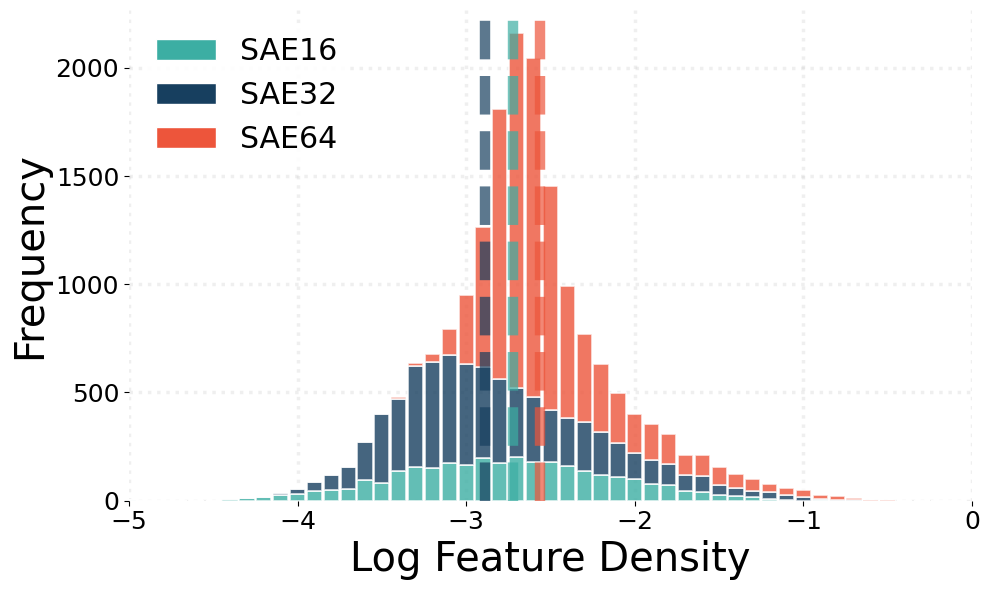

In [272]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.patches import Patch

# Base parameters
BASE_FONTSIZE = 24
BASE_LINEWIDTH = 5

# Reset default rc settings
plt.rcdefaults()

def calculate_log_feature_density(topk_indices, n_dirs):
    num_samples, k = topk_indices.shape
    feature_counts = np.bincount(topk_indices.flatten(), minlength=n_dirs)
    feature_density = feature_counts / num_samples
    log_feature_density = np.log10(feature_density + 1e-10)  # Use log10 for easier interpretation
    return log_feature_density

def calculate_histogram(x, start=-6, end=0, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    return bins[:-1], counts

def plot_log_feature_density(index_value_dict, model_configs, save_path=None):
    # Calculate log feature densities
    log_fd_dict = {k: calculate_log_feature_density(indices, model_configs[k]['n_dirs']) 
                   for k, (indices, _) in index_value_dict.items()}

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Color-blind friendly and professional palette
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    
    # Ensure the order of SAE models: 16, 32, 64
    ordered_keys = ['16', '32', '64']
    
    # Add histograms for each SAE model
    bottom = np.zeros(60)  # For stacking histograms
    for i, k in enumerate(ordered_keys):
        log_fd = log_fd_dict[k]
        name = f'SAE{k}'
        
        # Calculate histogram
        bins, counts = calculate_histogram(log_fd)
        
        # Add histogram
        ax.bar(bins, counts, bottom=bottom, width=0.09, color=colors[i], alpha=0.8, label=name, edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
        bottom += counts

        # Print statistics
        mean = np.mean(log_fd)
        median = np.median(log_fd)
        print(f"{name} statistics:")
        print(f"  Mean log feature density: {mean:.4f}")
        print(f"  Median log feature density: {median:.4f}")
        print()
        
        # Add median marker
        ax.axvline(x=median, color=colors[i], linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

    # Update layout
    ax.set_xlabel('Log Feature Density', fontsize=BASE_FONTSIZE * 1.2)
    ax.set_ylabel('Frequency', fontsize=BASE_FONTSIZE * 1.2)
    ax.tick_params(axis='both', which='major', labelsize=BASE_FONTSIZE*0.75)
    ax.set_xlim(-5, 0)

    # Add more subtle grid
    ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
    ax.set_axisbelow(True)

    # Customize legend
    legend_elements = [Patch(facecolor=colors[i], edgecolor='white', label=f'SAE{k}') for i, k in enumerate(ordered_keys)]
    ax.legend(handles=legend_elements, title_fontsize=BASE_FONTSIZE, fontsize=BASE_FONTSIZE * 0.9, loc='upper left', frameon=True, framealpha=0.9, edgecolor='none')

    # Set background color to white and remove border
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Model configurations
model_configs = {
    '16': {'n_dirs': 3072},
    '32': {'n_dirs': 6144},
    '64': {'n_dirs': 1536 * 6}
}

# Load the data
index_value_dict = {}
for k in ['16', '32', '64']:
    indices = np.load(f"../saerch/sae_data_astroPH/topk_indices_{k}.npy")
    values = np.load(f"../saerch/sae_data_astroPH/topk_values_{k}.npy")
    index_value_dict[k] = (indices, values)

# Generate the plot
#plot_log_feature_density(index_value_dict, model_configs)
# Uncomment next line to save:
plot_log_feature_density(index_value_dict, model_configs, '../output/log_feature_density.pdf')

SAE16 statistics (combined astroPH and csLG):
  Mean log feature density: -3.3634
  Median log feature density: -2.9146

SAE32 statistics (combined astroPH and csLG):
  Mean log feature density: -3.3927
  Median log feature density: -3.0341

SAE64 statistics (combined astroPH and csLG):
  Mean log feature density: -2.4109
  Median log feature density: -2.4810

Figure saved to ../output/log_feature_density_combined.pdf


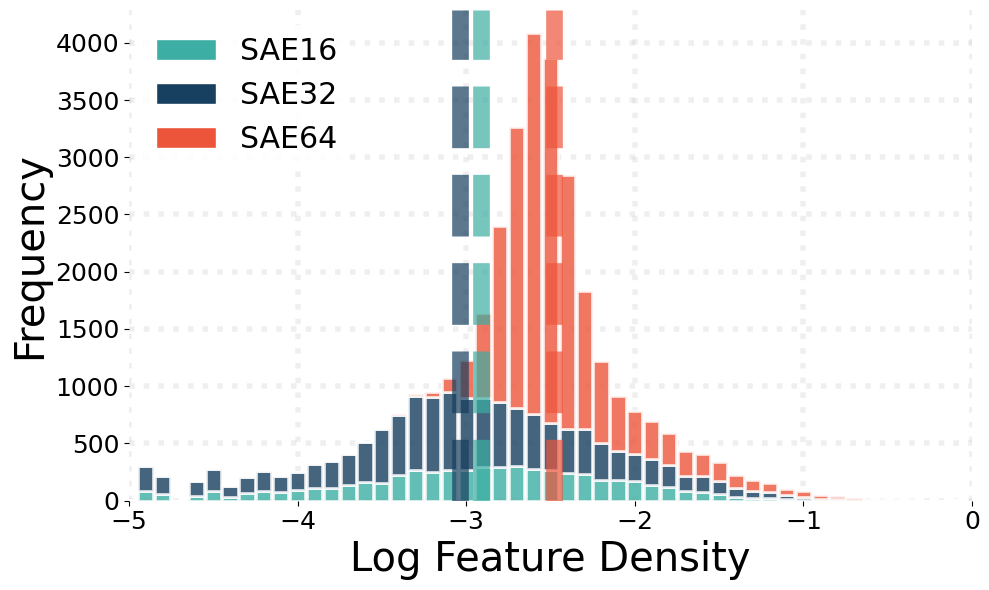

In [119]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.patches import Patch

# Base parameters
BASE_FONTSIZE = 24
BASE_LINEWIDTH = 8

# Reset default rc settings
plt.rcdefaults()

def calculate_log_feature_density(topk_indices, n_dirs):
    num_samples, k = topk_indices.shape
    feature_counts = np.bincount(topk_indices.flatten(), minlength=n_dirs)
    feature_density = feature_counts / num_samples
    log_feature_density = np.log10(feature_density + 1e-10)  # Use log10 for easier interpretation
    return log_feature_density

def calculate_histogram(x, start=-6, end=0, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    return bins[:-1], counts

def plot_log_feature_density(index_value_dict_astroPH, index_value_dict_csLG, model_configs, save_path=None):
    # Calculate log feature densities
    log_fd_dict = {}
    for dataset in ['astroPH', 'csLG']:
        index_value_dict = index_value_dict_astroPH if dataset == 'astroPH' else index_value_dict_csLG
        log_fd_dict[dataset] = {k: calculate_log_feature_density(indices, model_configs[k]['n_dirs'])
                                for k, (indices, _) in index_value_dict.items()}

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Color-blind friendly and professional palette
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    
    # Ensure the order of SAE models: 16, 32, 64
    ordered_keys = ['16', '32', '64']
    
    # Add histograms for each SAE model
    bottom = np.zeros(60)  # For stacking histograms
    for i, k in enumerate(ordered_keys):
        name = f'SAE{k}'
        
        # Combine log feature densities from both datasets
        log_fd_combined = np.concatenate([log_fd_dict['astroPH'][k], log_fd_dict['csLG'][k]])
        
        # Calculate histogram
        bins, counts = calculate_histogram(log_fd_combined)
        
        # Add histogram
        ax.bar(bins, counts, bottom=bottom, width=0.09, color=colors[i], alpha=0.8, label=name, edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
        bottom += counts
        
        # Print statistics
        mean = np.mean(log_fd_combined)
        median = np.median(log_fd_combined)
        print(f"{name} statistics (combined astroPH and csLG):")
        print(f"  Mean log feature density: {mean:.4f}")
        print(f"  Median log feature density: {median:.4f}")
        print()
        
        # Add median marker
        ax.axvline(x=median, color=colors[i], linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

    # Update layout
    ax.set_xlabel('Log Feature Density', fontsize=BASE_FONTSIZE * 1.2)
    ax.set_ylabel('Frequency', fontsize=BASE_FONTSIZE * 1.2)
    ax.tick_params(axis='both', which='major', labelsize=BASE_FONTSIZE*0.75)
    ax.set_xlim(-5, 0)

    # Add more subtle grid
    ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
    ax.set_axisbelow(True)

    # Customize legend
    legend_elements = [Patch(facecolor=colors[i], edgecolor='white', label=f'SAE{k}') for i, k in enumerate(ordered_keys)]
    ax.legend(handles=legend_elements, title_fontsize=BASE_FONTSIZE, fontsize=BASE_FONTSIZE * 0.9, loc='upper left', frameon=True, framealpha=0.9, edgecolor='none')

    # Set background color to white and remove border
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Model configurations
model_configs = {
    '16': {'n_dirs': 3072},
    '32': {'n_dirs': 6144},
    '64': {'n_dirs': 1536 * 6}
}

# Load the data for astroPH
index_value_dict_astroPH = {}
for k in ['16', '32', '64']:
    indices = np.load(f"../saerch/sae_data_astroPH/topk_indices_{k}.npy")
    values = np.load(f"../saerch/sae_data_astroPH/topk_values_{k}.npy")
    index_value_dict_astroPH[k] = (indices, values)

# Load the data for csLG
index_value_dict_csLG = {}
for k in ['16', '32', '64']:
    indices = np.load(f"../saerch/sae_data_csLG/topk_indices_{k}.npy")
    values = np.load(f"../saerch/sae_data_csLG/topk_values_{k}.npy")
    index_value_dict_csLG[k] = (indices, values)

# Generate the plot
#plot_log_feature_density(index_value_dict_astroPH, index_value_dict_csLG, model_configs)
# Uncomment next line to save:
plot_log_feature_density(index_value_dict_astroPH, index_value_dict_csLG, model_configs, '../output/log_feature_density_combined.pdf')

## Autointerp distributions

SAE16 statistics:
  Total correlations: 3072
  Valid correlations: 2687
  Invalid correlations: 385
  Mean correlation: 0.6162
  Median correlation: 0.7066

SAE32 statistics:
  Total correlations: 6143
  Valid correlations: 5463
  Invalid correlations: 680
  Mean correlation: 0.5741
  Median correlation: 0.6762

SAE64 statistics:
  Total correlations: 9200
  Valid correlations: 9160
  Invalid correlations: 40
  Mean correlation: 0.5277
  Median correlation: 0.6572

Figure saved to ../output/pearson_correlations.pdf


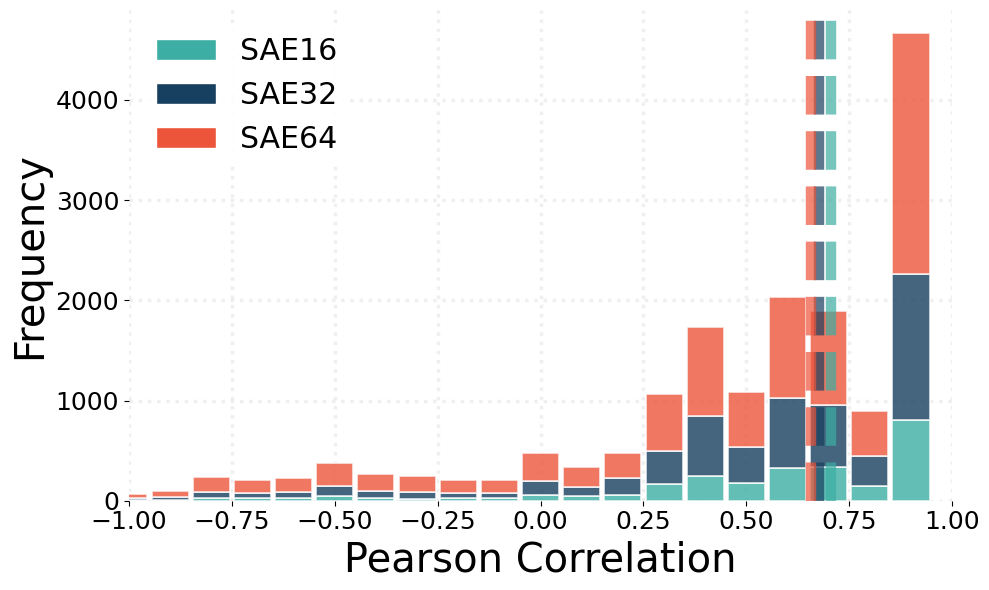

In [108]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import json
from matplotlib.patches import Patch

# Base parameters
BASE_FONTSIZE = 24
BASE_LINEWIDTH = 5

def load_pearson_correlations(filename):
    with open(filename, 'r') as f:
        data = json.load(f)
    return [result['pearson_correlation'] for result in data]

def calculate_histogram(x, start=-1, end=1, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    return bins[:-1], counts

def plot_pearson_correlations(correlation_dict, save_path=None):
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Color-blind friendly and professional palette
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    
    # Ensure the order of SAE models: 16, 32, 64
    ordered_keys = ['16', '32', '64']
    
    # Add histograms for each SAE model
    bottom = np.zeros(20)  # For stacking histograms
    for i, k in enumerate(ordered_keys):
        correlations = correlation_dict[k]
        name = f'SAE{k}'
        
        # Remove NaN and infinite values
        valid_correlations = np.array([c for c in correlations if np.isfinite(c)])
        
        # Calculate histogram
        bins, counts = calculate_histogram(valid_correlations)
        
        # Add histogram
        ax.bar(bins, counts, bottom=bottom, width=0.09, color=colors[i], alpha=0.8, label=name, edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
        bottom += counts

        # Print statistics
        mean = np.mean(valid_correlations)
        median = np.median(valid_correlations)
        print(f"{name} statistics:")
        print(f"  Total correlations: {len(correlations)}")
        print(f"  Valid correlations: {len(valid_correlations)}")
        print(f"  Invalid correlations: {len(correlations) - len(valid_correlations)}")
        print(f"  Mean correlation: {mean:.4f}")
        print(f"  Median correlation: {median:.4f}")
        print()
        
        # Add median marker
        ax.axvline(x=median, color=colors[i], linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

    # Update layout
    ax.set_xlabel('Pearson Correlation', fontsize=BASE_FONTSIZE * 1.2)
    ax.set_ylabel('Frequency', fontsize=BASE_FONTSIZE * 1.2)
    ax.tick_params(axis='both', which='major', labelsize=BASE_FONTSIZE*0.75)
    ax.set_xlim(-1, 1)

    # Add more subtle grid
    ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
    ax.set_axisbelow(True)

    # Customize legend
    legend_elements = [Patch(facecolor=colors[i], edgecolor='white', label=f'SAE{k}') for i, k in enumerate(ordered_keys)]
    ax.legend(handles=legend_elements, title_fontsize=BASE_FONTSIZE, fontsize=BASE_FONTSIZE * 0.9, loc='upper left', frameon=True, framealpha=0.9, edgecolor='none')

    # Set background color to white and remove border
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Load the data
correlation_dict = {
    '16': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_16.json'),
    '32': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_32.json'),
    '64': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_64.json')
}

# Generate the plot
# plot_pearson_correlations(correlation_dict)
# Uncomment next line to save:
plot_pearson_correlations(correlation_dict, '../output/pearson_correlations.pdf')

astroPH - SAE16 statistics:
  Total correlations: 3072
  Valid correlations: 3072
  Invalid correlations: 0
  Mean correlation: 0.5627
  Median correlation: 0.6637

astroPH - SAE32 statistics:
  Total correlations: 6125
  Valid correlations: 6122
  Invalid correlations: 3
  Mean correlation: 0.5109
  Median correlation: 0.6236

astroPH - SAE64 statistics:
  Total correlations: 9215
  Valid correlations: 9215
  Invalid correlations: 0
  Mean correlation: 0.3924
  Median correlation: 0.5249

csLG - SAE16 statistics:
  Total correlations: 3072
  Valid correlations: 2687
  Invalid correlations: 385
  Mean correlation: 0.6162
  Median correlation: 0.7066

csLG - SAE32 statistics:
  Total correlations: 6143
  Valid correlations: 5463
  Invalid correlations: 680
  Mean correlation: 0.5741
  Median correlation: 0.6762

csLG - SAE64 statistics:
  Total correlations: 9200
  Valid correlations: 9160
  Invalid correlations: 40
  Mean correlation: 0.5277
  Median correlation: 0.6572

Figure saved t

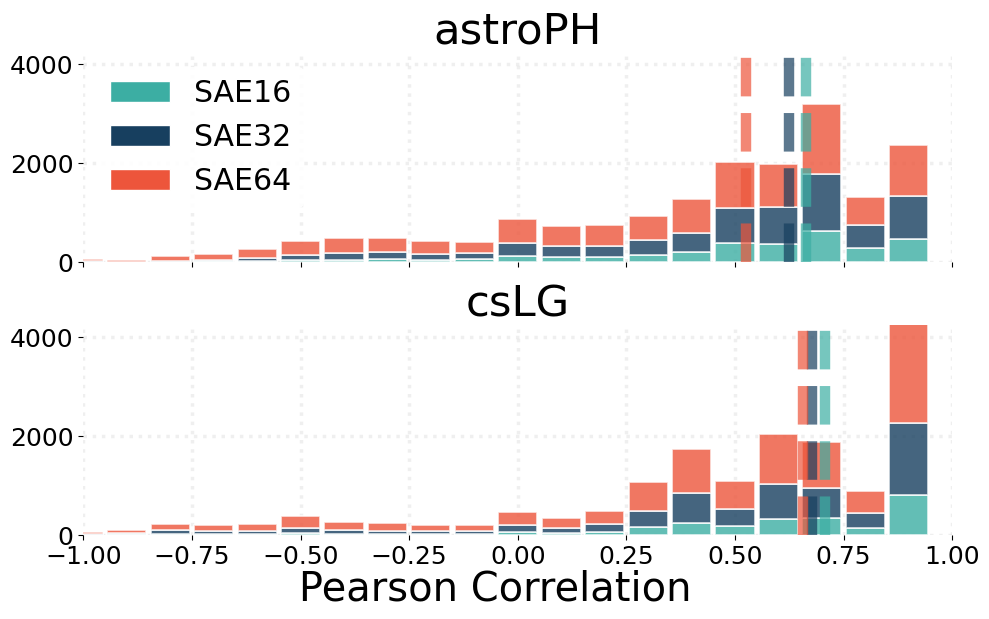

In [117]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import json
from matplotlib.patches import Patch

# Base parameters
BASE_FONTSIZE = 24
BASE_LINEWIDTH = 5

def load_pearson_correlations(filename):
    with open(filename, 'r') as f:
        data = json.load(f)
    return [result['pearson_correlation'] for result in data]

def calculate_histogram(x, start=-1, end=1, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    return bins[:-1], counts

def plot_pearson_correlations(correlation_dict_astroPH, correlation_dict_csLG, save_path=None):
    # Create figure and axes
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True, height_ratios=[1, 1])

    # Color-blind friendly and professional palette
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    
    # Ensure the order of SAE models: 16, 32, 64
    ordered_keys = ['16', '32', '64']
    
    for ax, correlation_dict, title in zip([ax1, ax2], [correlation_dict_astroPH, correlation_dict_csLG], ['astroPH', 'csLG']):
        # Add histograms for each SAE model
        bottom = np.zeros(20)  # For stacking histograms
        for i, k in enumerate(ordered_keys):
            correlations = correlation_dict[k]
            name = f'SAE{k}'
            
            # Remove NaN and infinite values
            valid_correlations = np.array([c for c in correlations if np.isfinite(c)])
            
            # Calculate histogram
            bins, counts = calculate_histogram(valid_correlations)
            
            # Add histogram
            ax.bar(bins, counts, bottom=bottom, width=0.09, color=colors[i], alpha=0.8, label=name, edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
            bottom += counts
            
            # Print statistics
            mean = np.mean(valid_correlations)
            median = np.median(valid_correlations)
            print(f"{title} - {name} statistics:")
            print(f"  Total correlations: {len(correlations)}")
            print(f"  Valid correlations: {len(valid_correlations)}")
            print(f"  Invalid correlations: {len(correlations) - len(valid_correlations)}")
            print(f"  Mean correlation: {mean:.4f}")
            print(f"  Median correlation: {median:.4f}")
            print()
            
            # Add median marker
            ax.axvline(x=median, color=colors[i], linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

        # Update layout
        ax.tick_params(axis='both', which='major', labelsize=BASE_FONTSIZE*0.75)
        ax.set_xlim(-1, 1)

        # Add more subtle grid
        ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
        ax.set_axisbelow(True)

        # Set title for each subplot
        ax.set_title(title, fontsize=BASE_FONTSIZE * 1.3)

        # Set background color to white and remove border
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(False)

     # Make y-axis the same for both subplots
    ax1.set_ylim(0, 4250)
    ax2.set_ylim(0, 4250)

    # Customize legend (only for the top subplot)
    legend_elements = [Patch(facecolor=colors[i], edgecolor='white', label=f'SAE{k}') for i, k in enumerate(ordered_keys)]
    ax1.legend(handles=legend_elements, title_fontsize=BASE_FONTSIZE, fontsize=BASE_FONTSIZE * 0.9, loc='upper left', frameon=True, framealpha=0.9, edgecolor='none')

    # Set common x-label
    fig.text(0.5, 0.01, 'Pearson Correlation', ha='center', va='center', fontsize=BASE_FONTSIZE * 1.2)

    # Set common y-label
    # fig.text(0.04, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=BASE_FONTSIZE * 1.2)

    plt.tight_layout()

    # Adjust the layout to make room for the common x-label
    plt.subplots_adjust(bottom=0.1, hspace=0.3)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Load the data for astroPH
correlation_dict_astroPH = {
    '16': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_16.json'),
    '32': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_32.json'),
    '64': load_pearson_correlations('../saerch/sae_data_astroPH/feature_analysis_results_64.json')
}

# Load the data for csLG
correlation_dict_csLG = {
    '16': load_pearson_correlations('../saerch/sae_data_csLG/feature_analysis_results_16.json'),
    '32': load_pearson_correlations('../saerch/sae_data_csLG/feature_analysis_results_32.json'),
    '64': load_pearson_correlations('../saerch/sae_data_csLG/feature_analysis_results_64.json')
}

# Generate the plot
# plot_pearson_correlations(correlation_dict_astroPH, correlation_dict_csLG)
# Uncomment next line to save:
plot_pearson_correlations(correlation_dict_astroPH, correlation_dict_csLG, '../output/pearson_correlations_combined.pdf')

## Maximum cosine similarity

In [153]:
path_16 = '../models/16_3072_24_auxk_epoch_50.pth'
path_32 = '../models/32_6144_64_auxk_epoch_50.pth'
path_64 = '../models/64_9216_128_auxk_epoch_50.pth'

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '16': {
        'path': path_16,
        'd_model': 1536,
        'n_dirs': 3072,
        'k': 16,
        'auxk': 24
    },
    '32': {
        'path': path_32,
        'd_model': 1536,
        'n_dirs': 6144,
        'k': 32,
        'auxk': 48
    },
    '64': {
        'path': path_64,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

# Get the decoder matrices
decoders = {}
for key, model in models.items():
    decoders[key] = model.decoder.weight.data.cpu().numpy()

decoders['16'].shape, decoders['32'].shape, decoders['64'].shape

# 32, 64
dot_products = np.dot(decoders['64'].T, decoders['64']) # (32_f, 64_f)
# Change everything over 0.998 to 0.0
dot_products[dot_products > 0.998] = 0.0
# Take maximum over the  64_f dimension
max_cosine_sims = np.max(dot_products, axis=1) # (32_f,)

# Plotly histogram
import plotly.graph_objects as go

fig = go.Figure(data=[go.Histogram(x=max_cosine_sims, nbinsx=50)])
fig.show()

In [32]:
import torch
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configs for loading the FastAutoencoders
torch.set_grad_enabled(False)

k_values = [16, 32, 64]
n_values = [3072, 6144, 9216]

model_configs = {}
for k in k_values:
    for n in n_values:
        key = f'{k}_{n}'
        model_configs[key] = {
            'path': f'../models/{k}_{n}_{k*2}_auxk_epoch_50.pth',
            'd_model': 1536,
            'n_dirs': n,
            'k': k,
            'auxk': k * 2
        }

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

# Get the decoder matrices
decoders = {}
for key, model in models.items():
    decoders[key] = model.decoder.weight.data.cpu().numpy()

# Create 3x3 subplots
fig = make_subplots(rows=3, cols=3, subplot_titles=[f'k={k}, n={n}' for k in k_values for n in n_values])

# Calculate and plot histograms
for i, k in enumerate(k_values):
    for j, n in enumerate(n_values):
        key = f'{k}_{n}'
        dot_products = np.dot(decoders[key].T, decoders[key])
        dot_products[dot_products > 0.9998] = 0.0
        max_cosine_sims = np.max(dot_products, axis=1)
        
        fig.add_trace(
            go.Histogram(x=max_cosine_sims, nbinsx=50),
            row=i+1, col=j+1
        )

# Base fontsize
base_fontsize = 28

# Update layout
fig.update_layout(
    height=900,
    width=1200,
    showlegend=False,
    font=dict(size=base_fontsize),
    title=dict(font=dict(size=base_fontsize * 1.2)),
    annotations=[dict(font=dict(size=base_fontsize * 0.8)) for annotation in fig['layout']['annotations']]
)

# Update subplot titles
for annotation in fig['layout']['annotations']:
    annotation['font'] = dict(size=base_fontsize * 1.2)

# Update x and y axis labels
for i in range(1, 4):
    for j in range(1, 4):
        if i == 3:
            fig.update_xaxes(title_text="Max Cosine Similarity", row=i, col=j, title_font=dict(size=base_fontsize))
        fig.update_yaxes(showticklabels=False, row=i, col=j)  # Remove y-axis labels

# Save as PDF
fig.write_image("../output/max_cosine_similarity_histograms_self.pdf")

fig.show()

In [8]:
d = decoders['64']
sims = (d.T @ d).flatten()

In [149]:
# 32, 64
dot_products = np.dot(decoders['64'].T, decoders['64']) # (32_f, 64_f)
# Change everything over 0.998 to 0.0
dot_products[dot_products > 0.998] = 0.0
# Take maximum over the  64_f dimension
max_cosine_sims = np.max(dot_products, axis=1) # (32_f,)

In [150]:
max_cosine_sims.shape

(9216,)

In [151]:
# Plotly histogram
import plotly.graph_objects as go

fig = go.Figure(data=[go.Histogram(x=max_cosine_sims, nbinsx=50)])
fig.show()

SAE32-SAE64 statistics:
  Mean max cosine similarity: 0.6170
  Median max cosine similarity: 0.5952

SAE16-SAE32 statistics:
  Mean max cosine similarity: 0.7950
  Median max cosine similarity: 0.8780

SAE16-SAE64 statistics:
  Mean max cosine similarity: 0.7280
  Median max cosine similarity: 0.7947

Figure saved to ../output/multiple_cosine_sim_histograms.pdf


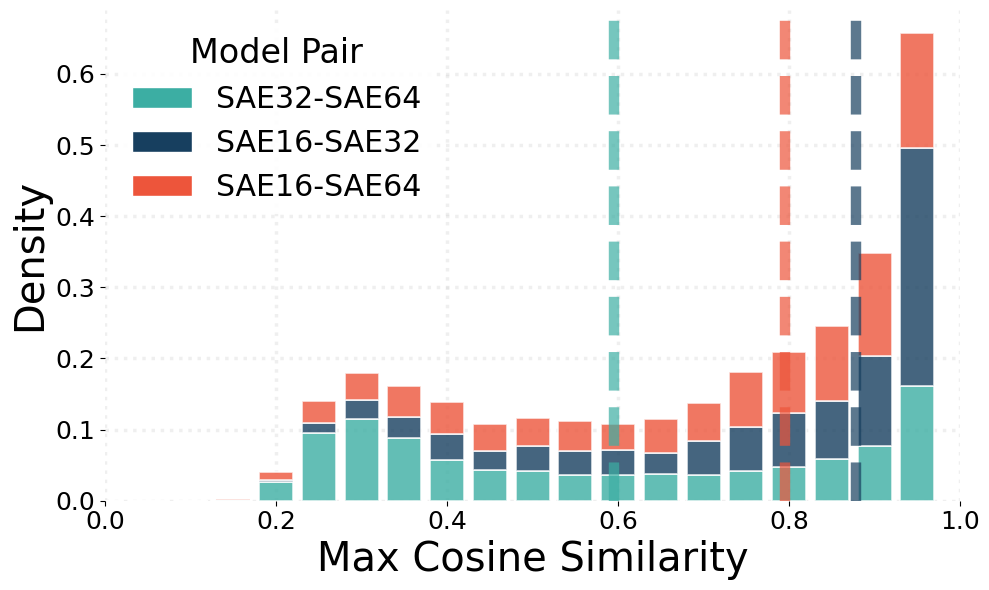

In [280]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.patches import Patch
import torch

# Base parameters
BASE_FONTSIZE = 24
BASE_LINEWIDTH = 5

path_16 = '../models/16_3072_24_auxk_epoch_50.pth'
path_32 = '../models/32_6144_64_auxk_epoch_50.pth'
path_64 = '../models/64_9216_128_auxk_epoch_50.pth'

# Configs for loading the FastAutoencoders
torch.set_grad_enabled(False)

model_configs = {
    '16': {'path': path_16, 'd_model': 1536, 'n_dirs': 3072, 'k': 16, 'auxk': 24},
    '32': {'path': path_32, 'd_model': 1536, 'n_dirs': 6144, 'k': 32, 'auxk': 48},
    '64': {'path': path_64, 'd_model': 1536, 'n_dirs': 1536 * 6, 'k': 64, 'auxk': 128}
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

# Get the decoder matrices
decoders = {}
for key, model in models.items():
    decoders[key] = model.decoder.weight.data.cpu().numpy()

def calculate_histogram(x, start=0, end=1, bin_size=0.05):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    # Normalise to be between 0 and 1
    counts = counts / sum(counts)
    return bins[:-1], counts

def plot_multiple_cosine_sims(decoders, save_path=None):
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Color-blind friendly and professional palette
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    
    pairs = [('32', '64'), ('16', '32'), ('16', '64')]
    
    bottom = np.zeros(20)  # For stacking histograms
    for i, (model1, model2) in enumerate(pairs):
        cosine_sims = np.dot(decoders[model1].T, decoders[model2])
        max_cosine_sims = np.max(cosine_sims, axis=1)
        
        name = f'SAE{model1}-SAE{model2}'
        
        # Calculate histogram
        bins, density = calculate_histogram(max_cosine_sims)
        
        # Add histogram
        ax.bar(bins, density, bottom=bottom, width=0.04, color=colors[i], alpha=0.8, label=name, edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
        bottom += density

        # Print statistics
        mean = np.mean(max_cosine_sims)
        median = np.median(max_cosine_sims)
        print(f"{name} statistics:")
        print(f"  Mean max cosine similarity: {mean:.4f}")
        print(f"  Median max cosine similarity: {median:.4f}")
        print()
        
        # Add median marker
        ax.axvline(x=median, color=colors[i], linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

    # Update layout
    ax.set_xlabel('Max Cosine Similarity', fontsize=BASE_FONTSIZE * 1.2)
    ax.set_ylabel('Density', fontsize=BASE_FONTSIZE * 1.2)
    ax.tick_params(axis='both', which='major', labelsize=BASE_FONTSIZE*0.75)
    ax.set_xlim(0, 1)

    # Add more subtle grid
    ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
    ax.set_axisbelow(True)

    # Customize legend
    legend_elements = [Patch(facecolor=colors[i], edgecolor='white', label=f'SAE{model1}-SAE{model2}') for i, (model1, model2) in enumerate(pairs)]
    ax.legend(handles=legend_elements, title='Model Pair', title_fontsize=BASE_FONTSIZE, fontsize=BASE_FONTSIZE * 0.9, loc='upper left', frameon=True, framealpha=0.9, edgecolor='none')

    # Set background color to white and remove border
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Generate the plot
#plot_multiple_cosine_sims(decoders)
# Uncomment the following line to save the plot
plot_multiple_cosine_sims(decoders, '../output/multiple_cosine_sim_histograms.pdf')

(3072, 3072)
(3072, 3072)
SAE32-SAE64 combined statistics for n=3072:
  Mean max cosine similarity: 0.6944
  Median max cosine similarity: 0.7652

(3072, 3072)
(3072, 3072)
SAE16-SAE32 combined statistics for n=3072:
  Mean max cosine similarity: 0.7374
  Median max cosine similarity: 0.8415

(3072, 3072)
(3072, 3072)
SAE16-SAE64 combined statistics for n=3072:
  Mean max cosine similarity: 0.6582
  Median max cosine similarity: 0.7127

(6144, 6144)
(6144, 6144)
SAE32-SAE64 combined statistics for n=6144:
  Mean max cosine similarity: 0.5710
  Median max cosine similarity: 0.4904

(6144, 6144)
(6144, 6144)
SAE16-SAE32 combined statistics for n=6144:
  Mean max cosine similarity: 0.6329
  Median max cosine similarity: 0.6263

(6144, 6144)
(6144, 6144)
SAE16-SAE64 combined statistics for n=6144:
  Mean max cosine similarity: 0.5490
  Median max cosine similarity: 0.4680

(9216, 9216)
(9216, 9216)
SAE32-SAE64 combined statistics for n=9216:
  Mean max cosine similarity: 0.5012
  Median ma

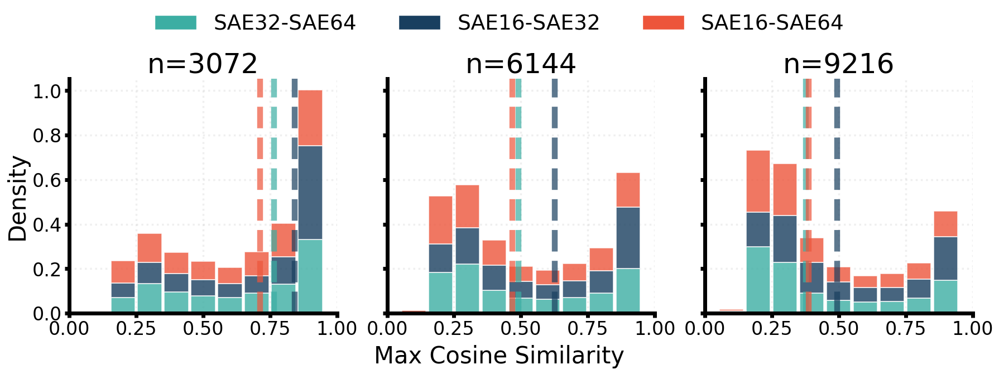

In [308]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.patches import Patch
from matplotlib.colors import LinearSegmentedColormap

# Base parameters
BASE_FONTSIZE = 30
BASE_LINEWIDTH = 5

torch.set_grad_enabled(False)

k_values = [16, 32, 64]
n_values = [3072, 6144, 9216]

model_configs = {}
for k in k_values:
    for n in n_values:
        key = f'{k}_{n}'
        model_configs[key] = {
            'original': {
                'path': f'../models/{k}_{n}_{k*2}_auxk_epoch_50.pth',
                'd_model': 1536,
                'n_dirs': n,
                'k': k,
                'auxk': k * 2
            },
            'csLG': {
                'path': f'../models/{k}_{n}_{k*2}_auxk_csLG_epoch_88.pth',
                'd_model': 1536,
                'n_dirs': n,
                'k': k,
                'auxk': k * 2
            }
        }

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, configs in model_configs.items():
    models[key] = {}
    for model_type, config in configs.items():
        model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
        model.load_state_dict(torch.load(config['path'], map_location=device))
        model = model.to(device)
        model.eval()
        models[key][model_type] = model

# Get the decoder matrices
decoders = {}
for key, model_dict in models.items():
    decoders[key] = {}
    for model_type, model in model_dict.items():
        decoders[key][model_type] = model.decoder.weight.data.cpu().numpy()

def calculate_histogram(x, start=0, end=1, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    counts = counts / sum(counts)
    return bins[:-1], counts

def plot_cosine_sims(decoders, n_values, base_fontsize=BASE_FONTSIZE, save_path=None):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    # Use the same colors as before
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    n_bins = 100
    cmap = LinearSegmentedColormap.from_list('custom_plasma', colors, N=n_bins)
    
    pairs = [('32', '64'), ('16', '32'), ('16', '64')]
    
    for col, n_value in enumerate(n_values):
        ax = axs[col]
        bottom = np.zeros(10)  # For stacking histograms
        
        for i, (model1, model2) in enumerate(pairs):
            combined_max_cosine_sims = []
            for model_type in ['original', 'csLG']:
                key1 = f'{model1}_{n_value}'
                key2 = f'{model2}_{n_value}'
                cosine_sims = np.dot(decoders[key1][model_type].T, decoders[key2][model_type])
                print(cosine_sims.shape)
                max_cosine_sims = np.max(cosine_sims, axis=1)
                combined_max_cosine_sims.extend(max_cosine_sims)
            
            name = f'SAE{model1}-SAE{model2}'
            
            # Calculate histogram for combined data
            bins, density = calculate_histogram(combined_max_cosine_sims)
            
            # Add histogram
            ax.bar(bins, density, bottom=bottom, width=0.09, color=cmap(i / 2), alpha=0.8, 
                   label=name if col == 0 else "", edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
            bottom += density

            # Print statistics
            mean = np.mean(combined_max_cosine_sims)
            median = np.median(combined_max_cosine_sims)
            print(f"{name} combined statistics for n={n_value}:")
            print(f"  Mean max cosine similarity: {mean:.4f}")
            print(f"  Median max cosine similarity: {median:.4f}")
            print()
            
            # Add median marker
            ax.axvline(x=median, color=cmap(i / 2), linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

        # Update layout for each subplot
        if col == 0:
            ax.set_ylabel('Density', fontsize=base_fontsize)
        ax.set_title(f"n={n_value}", fontsize=base_fontsize * 1.2)
        ax.tick_params(axis='both', which='major', labelsize=base_fontsize * 0.8, width=BASE_LINEWIDTH, length=6)
        ax.set_xlim(0, 1)

        # Add more subtle grid
        ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
        ax.set_axisbelow(True)

        # Set background color to white and add border only to bottom and left axes
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_linewidth(BASE_LINEWIDTH)
        ax.spines['left'].set_linewidth(BASE_LINEWIDTH)

    # Add a single x-axis label for all subplots
    fig.text(0.5, 0.02, 'Max Cosine Similarity', ha='center', va='center', fontsize=base_fontsize)

    # Customize legend
    legend_elements = [Patch(facecolor=cmap(i / 2), edgecolor='white', label=f'SAE{model1}-SAE{model2}') 
                       for i, (model1, model2) in enumerate(pairs)]
    fig.legend(handles=legend_elements, title_fontsize=base_fontsize, 
               fontsize=base_fontsize * 0.9, loc='upper center', bbox_to_anchor=(0.5, 1.10), 
               ncol=3, frameon=True, framealpha=0.9, edgecolor='none')

    plt.tight_layout()
    fig.subplots_adjust(top=0.85, bottom=0.15)  # Adjust to make room for the legend and x-axis label

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Generate plots for each n value side-by-side
#plot_cosine_sims(decoders, n_values, base_fontsize=BASE_FONTSIZE)
# Uncomment the following line to save the plot
plot_cosine_sims(decoders, n_values, base_fontsize=BASE_FONTSIZE, save_path='../output/combined_cosine_sim_histograms_n.pdf')

n=3072-n=6144 combined statistics for k=16:
  Mean max cosine similarity: 0.8186
  Median max cosine similarity: 0.9258

n=3072-n=9216 combined statistics for k=16:
  Mean max cosine similarity: 0.8282
  Median max cosine similarity: 0.9216

n=6144-n=9216 combined statistics for k=16:
  Mean max cosine similarity: 0.7041
  Median max cosine similarity: 0.7544

n=3072-n=6144 combined statistics for k=32:
  Mean max cosine similarity: 0.7920
  Median max cosine similarity: 0.8855

n=3072-n=9216 combined statistics for k=32:
  Mean max cosine similarity: 0.7954
  Median max cosine similarity: 0.8846

n=6144-n=9216 combined statistics for k=32:
  Mean max cosine similarity: 0.6563
  Median max cosine similarity: 0.6639

n=3072-n=6144 combined statistics for k=64:
  Mean max cosine similarity: 0.7015
  Median max cosine similarity: 0.7659

n=3072-n=9216 combined statistics for k=64:
  Mean max cosine similarity: 0.7025
  Median max cosine similarity: 0.7668

n=6144-n=9216 combined statistic

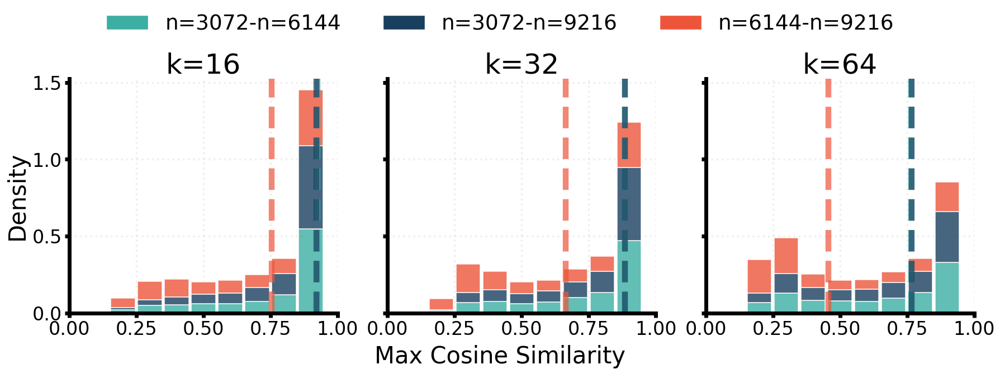

In [309]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.patches import Patch
from matplotlib.colors import LinearSegmentedColormap

# Base parameters
BASE_FONTSIZE = 30
BASE_LINEWIDTH = 5

torch.set_grad_enabled(False)

k_values = [16, 32, 64]
n_values = [3072, 6144, 9216]

model_configs = {}
for k in k_values:
    for n in n_values:
        key = f'{k}_{n}'
        model_configs[key] = {
            'original': {
                'path': f'../models/{k}_{n}_{k*2}_auxk_epoch_50.pth',
                'd_model': 1536,
                'n_dirs': n,
                'k': k,
                'auxk': k * 2
            },
            'csLG': {
                'path': f'../models/{k}_{n}_{k*2}_auxk_csLG_epoch_88.pth',
                'd_model': 1536,
                'n_dirs': n,
                'k': k,
                'auxk': k * 2
            }
        }

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, configs in model_configs.items():
    models[key] = {}
    for model_type, config in configs.items():
        model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
        model.load_state_dict(torch.load(config['path'], map_location=device))
        model = model.to(device)
        model.eval()
        models[key][model_type] = model

# Get the decoder matrices
decoders = {}
for key, model_dict in models.items():
    decoders[key] = {}
    for model_type, model in model_dict.items():
        decoders[key][model_type] = model.decoder.weight.data.cpu().numpy()

def calculate_histogram(x, start=0, end=1, bin_size=0.1):
    bins = np.arange(start, end + bin_size, bin_size)
    counts, _ = np.histogram(x, bins=bins)
    counts = counts / sum(counts)
    return bins[:-1], counts

def plot_cosine_sims_fixed_k(decoders, k_values, base_fontsize=BASE_FONTSIZE, save_path=None):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    colors = ['#3CAEA3', '#173F5F', '#ED553B']
    n_bins = 100
    cmap = LinearSegmentedColormap.from_list('custom_plasma', colors, N=n_bins)
    
    pairs = [('3072', '6144'), ('3072', '9216'), ('6144', '9216')]
    
    for col, k_value in enumerate(k_values):
        ax = axs[col]
        bottom = np.zeros(10)  # For stacking histograms
        
        for i, (n1, n2) in enumerate(pairs):
            combined_max_cosine_sims = []
            for model_type in ['original', 'csLG']:
                key1 = f'{k_value}_{n1}'
                key2 = f'{k_value}_{n2}'
                cosine_sims = np.dot(decoders[key1][model_type].T, decoders[key2][model_type])
                max_cosine_sims = np.max(cosine_sims, axis=1)
                combined_max_cosine_sims.extend(max_cosine_sims)
            
            name = f'n={n1}-n={n2}'
            
            # Calculate histogram for combined data
            bins, density = calculate_histogram(combined_max_cosine_sims)
            
            # Add histogram
            ax.bar(bins, density, bottom=bottom, width=0.09, color=cmap(i / 2), alpha=0.8, 
                   label=name if col == 0 else "", edgecolor='white', linewidth=BASE_LINEWIDTH * 0.25)
            bottom += density

            # Print statistics
            mean = np.mean(combined_max_cosine_sims)
            median = np.median(combined_max_cosine_sims)
            print(f"{name} combined statistics for k={k_value}:")
            print(f"  Mean max cosine similarity: {mean:.4f}")
            print(f"  Median max cosine similarity: {median:.4f}")
            print()
            
            # Add median marker
            ax.axvline(x=median, color=cmap(i / 2), linestyle='--', linewidth=BASE_LINEWIDTH * 1.5, alpha=0.7)

        # Update layout for each subplot
        if col == 0:
            ax.set_ylabel('Density', fontsize=base_fontsize)
        ax.set_title(f"k={k_value}", fontsize=base_fontsize * 1.2)
        ax.tick_params(axis='both', which='major', labelsize=base_fontsize * 0.8, width=BASE_LINEWIDTH, length=6)
        ax.set_xlim(0, 1)

        # Add more subtle grid
        ax.grid(True, linestyle=':', alpha=0.3, color='#CCCCCC', linewidth=BASE_LINEWIDTH * 0.5)
        ax.set_axisbelow(True)

        # Set background color to white and add border only to bottom and left axes
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_linewidth(BASE_LINEWIDTH)
        ax.spines['left'].set_linewidth(BASE_LINEWIDTH)

    # Add a single x-axis label for all subplots
    fig.text(0.5, 0.02, 'Max Cosine Similarity', ha='center', va='center', fontsize=base_fontsize)

    # Customize legend
    legend_elements = [Patch(facecolor=cmap(i / 2), edgecolor='white', label=f'n={n1}-n={n2}') 
                       for i, (n1, n2) in enumerate(pairs)]
    fig.legend(handles=legend_elements, title_fontsize=base_fontsize, 
               fontsize=base_fontsize * 0.9, loc='upper center', bbox_to_anchor=(0.5, 1.10), 
               ncol=3, frameon=True, framealpha=0.9, edgecolor='none')

    plt.tight_layout()
    fig.subplots_adjust(top=0.85, bottom=0.15)  # Adjust to make room for the legend and x-axis label

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    else:
        plt.show()

# Generate plots for each k value side-by-side
plot_cosine_sims_fixed_k(decoders, k_values, base_fontsize=BASE_FONTSIZE, save_path='../output/combined_cosine_sim_histograms_k.pdf')

## Statistics

In [12]:
import torch
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm
import numpy as np
import sys
sys.path.append('../')

from saerch.topk_sae import FastAutoencoder

In [13]:
path_16 = '../models/16_3072_24_auxk_epoch_50.pth'
path_32 = '../models/32_6144_48_auxk_epoch_50.pth'
path_64 = '../models/64_9216_128_auxk_epoch_50.pth'

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '16': {
        'path': path_16,
        'd_model': 1536,
        'n_dirs': 3072,
        'k': 16,
        'auxk': 24
    },
    '32': {
        'path': path_32,
        'd_model': 1536,
        'n_dirs': 6144,
        'k': 32,
        'auxk': 48
    },
    '64': {
        'path': path_64,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

# Get all the indices and values across abstracts and save
batch_size = 1024

# Load abstract embeddings
abstract_embeddings = np.load("../data/vector_store_astroPH/abstract_embeddings.npy")
abstract_embeddings = abstract_embeddings.astype(np.float32)

# Create a DataLoader for efficient batching
dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

for key, ae in models.items():
    k = int(key)

    # Prepare arrays to store results
    num_abstracts = len(abstract_embeddings)
    topk_indices = np.zeros((num_abstracts, k), dtype=np.int64)
    topk_values = np.zeros((num_abstracts, k), dtype=np.float32)

    # Process batches
    with torch.no_grad():
        for i, (batch,) in enumerate(tqdm(dataloader, desc="Processing abstracts")):
            batch = batch.to(device)
            _, info = ae(batch)
            
            start_idx = i * batch_size
            end_idx = start_idx + batch.size(0)
            
            topk_indices[start_idx:end_idx] = info['topk_indices'].cpu().numpy()
            topk_values[start_idx:end_idx] = info['topk_values'].cpu().numpy()

    # Save results
    np.save(f"../saerch/sae_data_astroPH/topk_indices_{k}.npy", topk_indices)
    np.save(f"../saerch/sae_data_astroPH/topk_values_{k}.npy", topk_values)

    print("Processing complete. Results saved in 'sae_data' folder.")

k_list = ['16', '32', '64']

# Load the data
index_value_dict = {}
for k in k_list:
    indices = np.load(f"../saerch/sae_data_astroPH/topk_indices_{k}.npy")
    values = np.load(f"../saerch/sae_data_astroPH/topk_values_{k}.npy")
    print(f"Top-{k} indices shape: {indices.shape}")
    print(f"Top-{k} values shape: {values.shape}")
    index_value_dict[k] = (indices, values)
    print()

def calculate_log_feature_density(topk_indices, n_dirs):
    num_samples, k = topk_indices.shape
    feature_counts = np.bincount(topk_indices.flatten(), minlength=n_dirs)
    feature_density = feature_counts / num_samples
    log_feature_density = np.log10(feature_density + 1e-10)  # Use log10 for easier interpretation
    return log_feature_density

def calculate_mean_activation_strength(topk_values):
    return topk_values.mean()


for k in k_list:
    feature_density = calculate_log_feature_density(index_value_dict[str(k)][0], 9216)
    print(f"Feature density mean for k={k}: {feature_density.mean()}")

    act_strength = calculate_mean_activation_strength(index_value_dict[str(k)][1])
    print(f"Mean activation strength for k={k}: {act_strength}")

In [16]:
k_list = ['16', '32', '64']

# Load the data
index_value_dict = {}
for k in k_list:
    indices = np.load(f"../saerch/sae_data_astroPH/topk_indices_{k}.npy")
    values = np.load(f"../saerch/sae_data_astroPH/topk_values_{k}.npy")
    print(f"Top-{k} indices shape: {indices.shape}")
    print(f"Top-{k} values shape: {values.shape}")
    index_value_dict[k] = (indices, values)
    print()

Top-16 indices shape: (271492, 16)
Top-16 values shape: (271492, 16)

Top-32 indices shape: (271492, 32)
Top-32 values shape: (271492, 32)

Top-64 indices shape: (271492, 64)
Top-64 values shape: (271492, 64)



In [73]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm

# Assuming FastAutoencoder class is defined elsewhere
# from your_module import FastAutoencoder

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Set grad to false
torch.set_grad_enabled(False)

# Define all combinations
n_dirs_list = [3072, 6144, 9216]
k_list = [16, 32, 64]

# Model configurations
model_configs = {
    (n, k): {
        'path': f'../models/{k}_{n}_{k*2:.0f}_auxk_csLG_epoch_88.pth',
        'd_model': 1536,
        'n_dirs': n,
        'k': k,
        'auxk': int(k * 2)
    }
    for n in n_dirs_list
    for k in k_list
}

# Load the models
models = {}
for config_key, config in model_configs.items():
    try:
        model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
        model.load_state_dict(torch.load(config['path'], map_location=device))
        model = model.to(device)
        model.eval()
        models[config_key] = model
    except:
        print(f"Error for {config_key}")

# Load abstract embeddings
abstract_embeddings = np.load("../data/vector_store_csLG/abstract_embeddings.npy")
abstract_embeddings = abstract_embeddings.astype(np.float32)

# Create a DataLoader for efficient batching
batch_size = 1024
dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Process data for each model
results = {}
for (n, k), ae in models.items():
    print(f"Processing model with n_dirs={n}, k={k}")
    
    # Prepare arrays to store results
    num_abstracts = len(abstract_embeddings)
    topk_indices = np.zeros((num_abstracts, k), dtype=np.int64)
    topk_values = np.zeros((num_abstracts, k), dtype=np.float32)
    
    # Process batches
    with torch.no_grad():
        for i, (batch,) in enumerate(tqdm(dataloader, desc="Processing abstracts")):
            batch = batch.to(device)
            _, info = ae(batch)
            
            start_idx = i * batch_size
            end_idx = start_idx + batch.size(0)
            
            topk_indices[start_idx:end_idx] = info['topk_indices'].cpu().numpy()
            topk_values[start_idx:end_idx] = info['topk_values'].cpu().numpy()
    
    results[(n, k)] = (topk_indices, topk_values)
    print(f"Processing complete for n_dirs={n}, k={k}")
    print()

# Calculate metrics
def calculate_log_feature_density(topk_indices, n_dirs):
    num_samples, k = topk_indices.shape
    feature_counts = np.bincount(topk_indices.flatten(), minlength=n_dirs)
    feature_density = feature_counts / num_samples
    log_feature_density = np.log10(feature_density + 1e-10)
    return log_feature_density

def calculate_mean_activation_strength(topk_values):
    return topk_values.mean()

# Print metrics for all combinations
print("Metrics for all combinations:")
for (n, k), (indices, values) in results.items():
    try:
        feature_density = calculate_log_feature_density(indices, n)
        act_strength = calculate_mean_activation_strength(values)
        
        print(f"n_dirs={n}, k={k}:")
        print(f"  Log Feature Density mean: {feature_density.mean():.4f}")
        print(f"  Mean Activation Strength: {act_strength:.4f}")
        print()
    except:
        print(f"Error for {(n, k)}")

Processing model with n_dirs=3072, k=16


Processing abstracts: 100%|██████████| 150/150 [00:04<00:00, 30.09it/s]


Processing complete for n_dirs=3072, k=16

Processing model with n_dirs=3072, k=32


Processing abstracts: 100%|██████████| 150/150 [00:05<00:00, 29.62it/s]


Processing complete for n_dirs=3072, k=32

Processing model with n_dirs=3072, k=64


Processing abstracts: 100%|██████████| 150/150 [00:05<00:00, 26.94it/s]


Processing complete for n_dirs=3072, k=64

Processing model with n_dirs=6144, k=16


Processing abstracts: 100%|██████████| 150/150 [00:07<00:00, 20.16it/s]


Processing complete for n_dirs=6144, k=16

Processing model with n_dirs=6144, k=32


Processing abstracts: 100%|██████████| 150/150 [00:08<00:00, 17.88it/s]


Processing complete for n_dirs=6144, k=32

Processing model with n_dirs=6144, k=64


Processing abstracts: 100%|██████████| 150/150 [00:08<00:00, 16.69it/s]


Processing complete for n_dirs=6144, k=64

Processing model with n_dirs=9216, k=16


Processing abstracts: 100%|██████████| 150/150 [00:10<00:00, 13.95it/s]


Processing complete for n_dirs=9216, k=16

Processing model with n_dirs=9216, k=32


Processing abstracts: 100%|██████████| 150/150 [00:10<00:00, 13.85it/s]


Processing complete for n_dirs=9216, k=32

Processing model with n_dirs=9216, k=64


Processing abstracts: 100%|██████████| 150/150 [00:12<00:00, 12.21it/s]


Processing complete for n_dirs=9216, k=64

Metrics for all combinations:
n_dirs=3072, k=16:
  Log Feature Density mean: -2.7314
  Mean Activation Strength: 0.1332

n_dirs=3072, k=32:
  Log Feature Density mean: -2.3008
  Mean Activation Strength: 0.0885

n_dirs=3072, k=64:
  Log Feature Density mean: -1.8875
  Mean Activation Strength: 0.0584

n_dirs=6144, k=16:
  Log Feature Density mean: -3.2299
  Mean Activation Strength: 0.1342

n_dirs=6144, k=32:
  Log Feature Density mean: -2.6687
  Mean Activation Strength: 0.0873

n_dirs=6144, k=64:
  Log Feature Density mean: -2.1852
  Mean Activation Strength: 0.0558

n_dirs=9216, k=16:
  Log Feature Density mean: -3.4833
  Mean Activation Strength: 0.1343

n_dirs=9216, k=32:
  Log Feature Density mean: -2.9031
  Mean Activation Strength: 0.0875

n_dirs=9216, k=64:
  Log Feature Density mean: -2.3536
  Mean Activation Strength: 0.0545



Computer science:

In [ ]:
path_64 = '../models/64_9216_128_auxk_csLG_epoch_88.pth'

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '16': {
        'path': path_16,
        'd_model': 1536,
        'n_dirs': 3072,
        'k': 16,
        'auxk': 32
    },
    '32': {
        'path': path_32,
        'd_model': 1536,
        'n_dirs': 6144,
        'k': 32,
        'auxk': 64
    },
    '64': {
        'path': path_64,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
models = {}
for key, config in model_configs.items():
    model = FastAutoencoder(config['n_dirs'], config['d_model'], config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model = model.to(device)
    model.eval()
    models[key] = model

# Get all the indices and values across abstracts and save
batch_size = 1024

# Load abstract embeddings
abstract_embeddings = np.load("../data/vector_store_csLG/abstract_embeddings.npy")
abstract_embeddings = abstract_embeddings.astype(np.float32)

# Create a DataLoader for efficient batching
dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

for key, ae in models.items():
    k = int(key)

    # Prepare arrays to store results
    num_abstracts = len(abstract_embeddings)
    topk_indices = np.zeros((num_abstracts, k), dtype=np.int64)
    topk_values = np.zeros((num_abstracts, k), dtype=np.float32)

    # Process batches
    with torch.no_grad():
        for i, (batch,) in enumerate(tqdm(dataloader, desc="Processing abstracts")):
            batch = batch.to(device)
            _, info = ae(batch)
            
            start_idx = i * batch_size
            end_idx = start_idx + batch.size(0)
            
            topk_indices[start_idx:end_idx] = info['topk_indices'].cpu().numpy()
            topk_values[start_idx:end_idx] = info['topk_values'].cpu().numpy()

    # Save results
    np.save(f"../saerch/sae_data_csLG/topk_indices_{k}.npy", topk_indices)
    np.save(f"../saerch/sae_data_csLG/topk_values_{k}.npy", topk_values)

    print("Processing complete. Results saved in 'sae_data' folder.")

## Activating examples

In [128]:
path = "../models/64_9216_128_auxk_epoch_50.pth"

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '64': {
        'path': path,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
model = FastAutoencoder(model_configs['64']['n_dirs'], model_configs['64']['d_model'], model_configs['64']['k'], model_configs['64']['auxk'], multik=0)
model.load_state_dict(torch.load(model_configs['64']['path'], map_location=device))

# Load topk indices and values
topk_indices = np.load("../saerch/sae_data_astroPH/topk_indices_64.npy")
topk_values = np.load("../saerch/sae_data_astroPH/topk_values_64.npy")

# Load abstract texts
with open("../data/vector_store_astroPH/abstract_texts.json", "r") as f:
    abstract_texts = json.load(f)

# Load feature analysis results
path = "../saerch/sae_data_astroPH/feature_analysis_results_64.json"

with open(path, 'r') as f:
    data = json.load(f)

# Get 10 features with f1 = 1.0 from data
top_features = [result for result in data if result['f1'] == 1.0][:50]

index = 383

# Get feature label
feature_label = [x['label'] for x in top_features if x['index'] == index][0]

# Get the row, column indices for where index is in topk_indices
abstract_indices_row, abstract_indices_column = np.where(topk_indices == index)

# Get the values for each row, column pair
values = topk_values[abstract_indices_row, abstract_indices_column]

# Get the indices of the topk values
topk_values_index = values.argsort()[-3:][::-1]

# Get these from abstract_indices_row
abstract_indices = abstract_indices_row[topk_values_index]
abstract_indices, values[topk_values_index]

# Print the abstracts
print(f"Feature label: {feature_label}")
for i, idx in enumerate(abstract_indices):
    print(f"Abstract {i + 1}:")
    # Print activation
    print(f"Activation strength: {values[topk_values_index[i]]:.4f}")
    print(abstract_texts['abstracts'][int(idx)])
    print()

<All keys matched successfully>

In [132]:
path = "../models/64_9216_128_auxk_csLG_epoch_88.pth"

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '64': {
        'path': path,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
model = FastAutoencoder(model_configs['64']['n_dirs'], model_configs['64']['d_model'], model_configs['64']['k'], model_configs['64']['auxk'], multik=0)
model.load_state_dict(torch.load(model_configs['64']['path'], map_location=device))

# Load topk indices and values
topk_indices = np.load("../saerch/sae_data_csLG/topk_indices_64.npy")
topk_values = np.load("../saerch/sae_data_csLG/topk_values_64.npy")

# Load abstract texts
with open("../data/vector_store_csLG/abstract_texts.json", "r") as f:
    abstract_texts = json.load(f)

# Load feature analysis results
path = "../saerch/sae_data_csLG/feature_analysis_results_64.json"

with open(path, 'r') as f:
    data = json.load(f)

# Get 10 features with f1 = 1.0 from data
top_features = [result for result in data if result['f1'] == 1.0][:50]

# Print the index and label of the top features
for i, feature in enumerate(top_features):
    print(f"Feature {i + 1}:")
    print(f"Index: {feature['index']}")
    print(f"Label: {feature['label']}")
    print()

Feature 1:
Index: 11
Label: Preference Learning in Machine Learning

Feature 2:
Index: 5
Label: Lloyd's algorithm and k-means clustering

Feature 3:
Index: 13
Label: Mechanism Design and Differential Privacy

Feature 4:
Index: 0
Label: Diffusion models in generative tasks

Feature 5:
Index: 17
Label: Sparsity in Neural Networks

Feature 6:
Index: 16
Label: Koopman operator theory in dynamical systems

Feature 7:
Index: 28
Label: Differential Privacy and Applications

Feature 8:
Index: 33
Label: Practical ML/AI applications and performance optimization

Feature 9:
Index: 30
Label: Optimization and Integration of Solvers in ML

Feature 10:
Index: 32
Label: Graphon models in network analysis

Feature 11:
Index: 34
Label: Hyperparameter Tuning in Machine Learning

Feature 12:
Index: 39
Label: Pandemic response and management strategies

Feature 13:
Index: 41
Label: Applications of ML in specific domains

Feature 14:
Index: 45
Label: Weisfeiler-Leman algorithm in graph learning

Feature 15:

In [136]:
indices = [0, 17, 76, 179] # 0, 16

for index in indices:

    # Get feature label
    feature_label = [x['label'] for x in top_features if x['index'] == index][0]

    # Get the row, column indices for where index is in topk_indices
    abstract_indices_row, abstract_indices_column = np.where(topk_indices == index)

    # Get the values for each row, column pair
    values = topk_values[abstract_indices_row, abstract_indices_column]

    # Get the indices of the topk values
    topk_values_index = values.argsort()[-3:][::-1]

    # Get these from abstract_indices_row
    abstract_indices = abstract_indices_row[topk_values_index]
    abstract_indices, values[topk_values_index]

    # Print the abstracts
    print(f"Feature label: {feature_label}")
    for i, idx in enumerate(abstract_indices):
        print(f"Abstract {i + 1}:")
        # Print activation
        print(f"Activation strength: {values[topk_values_index[i]]:.4f}")
        print(abstract_texts['abstracts'][int(idx)])
        print('\n\n')

Feature label: Diffusion models in generative tasks
Abstract 1:
Activation strength: 0.1290
Boosting Fast and High-Quality Speech Synthesis with Linear Diffusion

Denoising Diffusion Probabilistic Models have shown extraordinary ability on various generative tasks. However, their slow inference speed renders them impractical in speech synthesis. This paper proposes a linear diffusion model (LinDiff) based on an ordinary differential equation to simultaneously reach fast inference and high sample quality. Firstly, we employ linear interpolation between the target and noise to design a diffusion sequence for training, while previously the diffusion path that links the noise and target is a curved segment. When decreasing the number of sampling steps (i.e., the number of line segments used to fit the path), the ease of fitting straight lines compared to curves allows us to generate higher quality samples from a random noise with fewer iterations. Secondly, to reduce computational complexi

In [ ]:
index = 383

# Get feature label
feature_label = [x['label'] for x in top_features if x['index'] == index][0]

# Get the row, column indices for where index is in topk_indices
abstract_indices_row, abstract_indices_column = np.where(topk_indices == index)

# Get the values for each row, column pair
values = topk_values[abstract_indices_row, abstract_indices_column]

# Get the indices of the topk values
topk_values_index = values.argsort()[-3:][::-1]

# Get these from abstract_indices_row
abstract_indices = abstract_indices_row[topk_values_index]
abstract_indices, values[topk_values_index]

# Print the abstracts
print(f"Feature label: {feature_label}")
for i, idx in enumerate(abstract_indices):
    print(f"Abstract {i + 1}:")
    # Print activation
    print(f"Activation strength: {values[topk_values_index[i]]:.4f}")
    print(abstract_texts['abstracts'][int(idx)])
    print()

## Iterative decoding

In [322]:
import torch
import torch.nn.functional as F
import torch.nn as nn 

In [314]:
# Load the SAE
path = "../models/64_9216_128_auxk_csLG_epoch_88.pth"

# Configs for loading the FastAutoencoders
# Set grad to false
torch.set_grad_enabled(False)

model_configs = {
    '64': {
        'path': path,
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the models
model = FastAutoencoder(model_configs['64']['n_dirs'], model_configs['64']['d_model'], model_configs['64']['k'], model_configs['64']['auxk'], multik=0)
model.load_state_dict(torch.load(model_configs['64']['path'], map_location=device))

# Embedding client from OpenAI
from openai import OpenAI
import yaml

# Load the OpenAI API key
with open('../config.yaml') as f:
    openai_key = yaml.load(f, Loader=yaml.FullLoader)['openai_api_key']

# Initialize the OpenAI client
client = OpenAI(api_key=openai_key)

def embed(text):
    embedding = client.embeddings.create(input=[text], model='text-embedding-3-small').data[0].embedding
    return np.array(embedding, dtype=np.float32)  # Convert to 32-bit float NumPy array

abstract = """
Mechanistic interpretability (MI) is an emerging sub-field of interpretability that seeks to understand a neural network model by reverse-engineering its internal computations. Recently, MI has garnered significant attention for interpreting transformer-based language models (LMs), resulting in many novel insights yet introducing new challenges. However, there has not been work that comprehensively reviews these insights and challenges, particularly as a guide for newcomers to this field. To fill this gap, we present a comprehensive survey outlining fundamental objects of study in MI, techniques that have been used for its investigation, approaches for evaluating MI results, and significant findings and applications stemming from the use of MI to understand LMs. In particular, we present a roadmap for beginners to navigate the field and leverage MI for their benefit. Finally, we also identify current gaps in the field and discuss potential future directions.
"""

print(abstract)

# Embed the abstract
abstract_embedding = embed(abstract)

# Pass the embedding through the SAE
with torch.no_grad():
    abstract_embedding = torch.from_numpy(abstract_embedding).to(device)
    output, info = model(abstract_embedding.unsqueeze(0))
    topk_indices = info['topk_indices'].cpu().numpy()
    topk_values = info['topk_values'].cpu().numpy()

loss = F.mse_loss(output.squeeze(), abstract_embedding)
print(f"Loss: {loss:.4f}")

# Load the feature analysis results
path = "../saerch/sae_data_csLG/feature_analysis_results_64.json"

with open(path, 'r') as f:
    data = json.load(f)

# Print out the top 5 active features
top_5_features = topk_indices[0, :5]
for i, feature in enumerate(top_5_features):
    feature_label = [x['label'] for x in data if x['index'] == feature][0]
    print(f"Feature {i + 1}: {feature_label}")

# Print out feature 14 from feature_analysis_results_64.json
feature = 14
feature_label = [x['label'] for x in data if x['index'] == feature][0]
print(f"Feature {feature}: {feature_label}")

# Convert topk_indices and topk_values to list
topk_indices_list = topk_indices.tolist()[0]
topk_values_list = topk_values.tolist()[0]

# Remove the last index and value
topk_indices_list = topk_indices_list[:-1]
topk_values_list = topk_values_list[:-1]

feature, value = 14, 0.3
topk_indices_list.append(feature)
topk_values_list.append(value)

# Store original latents
original_latents = torch.zeros(9216)
original_latents.scatter_(-1, torch.tensor(topk_indices).squeeze(), torch.tensor(topk_values).squeeze())

# Decode with decode_sparse
modified = model.decode_sparse(torch.tensor(topk_indices_list), torch.tensor(topk_values_list))

print(F.mse_loss(modified.squeeze(), abstract_embedding))
print(F.mse_loss(modified.squeeze(), output.squeeze()))

# Encode again
with torch.no_grad():
    modified_output, modified_info = model(modified)
    modified_topk_indices = modified_info['topk_indices'].cpu().numpy()
    modified_topk_values = modified_info['topk_values'].cpu().numpy()
    modified_latents = torch.zeros(9216)
    modified_latents.scatter_(-1, torch.tensor(modified_topk_indices).squeeze(), torch.tensor(modified_topk_values).squeeze())
    print(F.mse_loss(modified_output.squeeze(), abstract_embedding))
    print(F.mse_loss(modified_output.squeeze(), output.squeeze()))
    # Print topk indices and values
    print(modified_topk_indices)
    print(topk_indices)
    print(modified_topk_values)
    # Print MSE loss between original values and modified values
    print(F.mse_loss(torch.tensor(topk_values_list), torch.tensor(modified_topk_values)))
    # Print MSE loss between original latents and modified latents
    print(F.mse_loss(original_latents, modified_latents))

<All keys matched successfully>

In [448]:
import torch
import torch.nn.functional as F
import numpy as np
from openai import OpenAI
import yaml
import json
from typing import Dict, Any

# Ensure gradients are enabled
torch.set_grad_enabled(True)
torch.autograd.set_detect_anomaly(True)

# Load configurations and models
def load_configs() -> Dict[str, Any]:
    path = "../models/64_9216_128_auxk_csLG_epoch_88.pth"
    model_configs = {
        '64': {
            'path': path,
            'd_model': 1536,
            'n_dirs': 1536 * 6,
            'k': 64,
            'auxk': 128
        }
    }
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    return model_configs, device

def load_model(configs: Dict[str, Any], device: torch.device) -> FastAutoencoder:
    model = FastAutoencoder(configs['64']['n_dirs'], configs['64']['d_model'], 
                            configs['64']['k'], configs['64']['auxk'], multik=0)
    model.load_state_dict(torch.load(configs['64']['path'], map_location=device))
    model.to(device)
    model.eval()
    return model

def load_openai_client() -> OpenAI:
    with open('../config.yaml') as f:
        openai_key = yaml.safe_load(f)['openai_api_key']
    return OpenAI(api_key=openai_key)

def embed(text: str, client: OpenAI) -> np.ndarray:
    embedding = client.embeddings.create(input=[text], model='text-embedding-3-small').data[0].embedding
    return np.array(embedding, dtype=np.float32)

def load_feature_analysis(path: str) -> Dict[int, str]:
    with open(path, 'r') as f:
        data = json.load(f)
    return {x['index']: x['label'] for x in data}

def optimize_latents_encoder(model: FastAutoencoder, 
                             original_latents: torch.Tensor,
                             target_feature: int, 
                             target_value: float,
                             steps: int = 10,
                             learning_rate: float = 0.001) -> torch.Tensor:
    # Extract encoder and latent bias from the model
    encoder = model.encoder
    latent_bias = model.latent_bias

    # Initialize latents with the original latents
    latents = original_latents.clone().detach().requires_grad_(True)
    
    # Set up optimizer and scheduler
    optimizer = torch.optim.AdamW([latents], lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, steps, eta_min=0, last_epoch=-1)

    losses = []

    # Calculate initial loss
    loss = F.mse_loss(encoder(model.decoder(latents)) + latent_bias, original_latents)
    losses.append(loss.item())

    for step in range(steps):
        optimizer.zero_grad()
        
        # Encode latents
        encoded = encoder(model.decoder(latents)) + latent_bias
        
        # Apply ReLU and top-k selection
        topk_values, topk_indices = torch.topk(encoded, k=model.k)
        new_latents = torch.zeros_like(encoded)
        new_latents.scatter_(-1, topk_indices, F.relu(topk_values))
        
        # Ensure target feature has the desired value
        # new_latents[target_feature] = target_value
        
        # Compute loss
        loss = F.mse_loss(new_latents, original_latents)
        losses.append(loss.item())
        
        # Backpropagate and optimize
        loss.backward()
        optimizer.step()
        scheduler.step()
        
        # Print progress every 100 steps
        if step % 1 == 0:
            print(f"Step {step}, Loss: {loss.item():.6f}")

    return latents, losses

def main():
    model_configs, device = load_configs()
    model = load_model(model_configs, device)
    client = load_openai_client()
    feature_analysis = load_feature_analysis("../saerch/sae_data_csLG/feature_analysis_results_64.json")

    abstract = """
    Hierarchical VQ-VAE for transformer planning and reasoning"""

    abstract_embedding = torch.from_numpy(embed(abstract, client)).to(device)

    # Get initial latents
    with torch.no_grad():
        output, info = model(abstract_embedding.unsqueeze(0))
        initial_latents = torch.zeros(model.n_dirs, device=device)
        initial_latents.scatter_(-1, info['topk_indices'].squeeze(), info['topk_values'].squeeze())

    # Target feature to optimize
    target_feature, target_value = 15, 0.3

    # Set the initial latents to the target value
    initial_latents[target_feature] = target_value

    # Optimize latents
    optimized_latents, losses = optimize_latents_encoder(model, initial_latents, target_feature, target_value)

    # Print top 5 features
    top_5_features = torch.topk(optimized_latents, k=10).indices
    for i, feature in enumerate(top_5_features):
        print(f"Feature {i + 1}: {feature_analysis[feature.item()]}")
    print()
    # Print top 5 features in initial latents
    top_5_features_initial = torch.topk(initial_latents, k=10).indices
    for i, feature in enumerate(top_5_features_initial):
        print(f"Feature {i + 1}: {feature_analysis[feature.item()]}")
    print()

    # Print the target feature rank and value in optimized latents
    target_feature_rank = torch.argsort(optimized_latents, descending=True).tolist().index(target_feature)
    target_feature_value = optimized_latents[target_feature].item()
    print(f"Target Feature {target_feature}: {feature_analysis[target_feature]}")
    print(f"Target Feature Rank: {target_feature_rank}")
    print(f"Target Feature Value: {target_feature_value:.4f}")

    return losses

losses = main()

Step 0, Loss: 0.000006
Step 1, Loss: 0.000007
Step 2, Loss: 0.000006
Step 3, Loss: 0.000005
Step 4, Loss: 0.000005
Step 5, Loss: 0.000005
Step 6, Loss: 0.000004
Step 7, Loss: 0.000004
Step 8, Loss: 0.000004
Step 9, Loss: 0.000004
Feature 1: Advanced ML concepts starting with V
Feature 2: Simplicial Complexes and Their Applications
Feature 3: Planning in reinforcement learning
Feature 4: Transformer architectures and applications
Feature 5: Q-Learning and its enhancements
Feature 6: Hierarchical Structures in Machine Learning
Feature 7: Reasoning in Language Models
Feature 8: Variational Autoencoders (VAEs)
Feature 9: Generalization and optimization in Transformers
Feature 10: Hierarchical and Heterogeneous Networks

Feature 1: Advanced ML concepts starting with V
Feature 2: Simplicial Complexes and Their Applications
Feature 3: Planning in reinforcement learning
Feature 4: Transformer architectures and applications
Feature 5: Q-Learning and its enhancements
Feature 6: Hierarchical Stru

In [449]:
# Import plotly express
import plotly.express as px

fig = px.line(x=range(len(losses)), y=losses, title="Losses over Optimization Steps", labels={'x': 'Step', 'y': 'Loss'})
# Log x-axis
#fig.update_xaxes(type='log')
fig.update_yaxes(type='log')
fig.show()

In [477]:
import torch
import torch.nn.functional as F
import numpy as np
from openai import OpenAI
import yaml
import json
from typing import Dict, Any, List, Tuple
from tqdm import tqdm
import random

# Assume FastAutoencoder is imported or defined elsewhere

def load_openai_client() -> OpenAI:
    with open('../config.yaml') as f:
        openai_key = yaml.safe_load(f)['openai_api_key']
    return OpenAI(api_key=openai_key)

def embed(text: str, client: OpenAI) -> np.ndarray:
    embedding = client.embeddings.create(input=[text], model='text-embedding-3-small').data[0].embedding
    return np.array(embedding, dtype=np.float32)

def load_feature_analysis(path: str) -> Dict[int, str]:
    with open(path, 'r') as f:
        data = json.load(f)
    return {x['index']: x['label'] for x in data}

def load_model(config: Dict[str, Any], device: torch.device) -> FastAutoencoder:
    model = FastAutoencoder(config['n_dirs'], config['d_model'], 
                            config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model.to(device)
    model.eval()
    return model

def load_abstracts(file_path: str) -> List[str]:
    with open(file_path, 'r') as f:
        return f.read().split('\n\n')

def normalize_mse(mse: float, original_latents: torch.Tensor) -> float:
    return mse / torch.mean(original_latents ** 2).item()

def optimize_latents_encoder(model: FastAutoencoder, 
                             original_latents: torch.Tensor,
                             target_feature: int, 
                             target_value: float,
                             steps: int = 10,
                             learning_rate: float = 0.001) -> Tuple[torch.Tensor, List[float]]:
    encoder = model.encoder
    latent_bias = model.latent_bias
    latents = original_latents.clone().detach().requires_grad_(True)
    
    optimizer = torch.optim.AdamW([latents], lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, steps, eta_min=0, last_epoch=-1)

    normalized_losses = []

    for _ in range(steps):
        optimizer.zero_grad()
        
        encoded = encoder(model.decoder(latents)) + latent_bias
        topk_values, topk_indices = torch.topk(encoded, k=model.k)
        new_latents = torch.zeros_like(encoded)
        new_latents.scatter_(-1, topk_indices, F.relu(topk_values))
        
        loss = F.mse_loss(new_latents, original_latents)
        normalized_loss = normalize_mse(loss.item(), original_latents)
        normalized_losses.append(normalized_loss)
        
        loss.backward()
        optimizer.step()
        scheduler.step()

    return latents, normalized_losses

def direct_intervention(original_latents: torch.Tensor, target_feature: int, target_value: float) -> torch.Tensor:
    modified_latents = original_latents.clone()
    modified_latents[target_feature] = target_value
    return modified_latents

def calculate_metrics(original_latents: torch.Tensor, modified_latents: torch.Tensor, target_feature: int) -> Dict[str, float]:
    cosine_sim = F.cosine_similarity(original_latents.unsqueeze(0), modified_latents.unsqueeze(0)).item()
    original_rank = torch.argsort(original_latents, descending=True).tolist().index(target_feature)
    modified_rank = torch.argsort(modified_latents, descending=True).tolist().index(target_feature)
    non_target_change = torch.mean(torch.abs(original_latents - modified_latents)).item()
    
    return {
        "cosine_similarity": cosine_sim,
        "original_rank": original_rank,
        "modified_rank": modified_rank,
        "non_target_change": non_target_change
    }

def process_abstracts_for_model(abstracts: List[str], model: FastAutoencoder, client: OpenAI, device: torch.device) -> List[Dict[str, Any]]:
    results = []
    
    for abstract in tqdm(abstracts):
        abstract_embedding = torch.from_numpy(embed(abstract, client)).to(device)
        
        with torch.no_grad():
            output, info = model(abstract_embedding.unsqueeze(0))
            initial_latents = torch.zeros(model.n_dirs, device=device)
            initial_latents.scatter_(-1, info['topk_indices'].squeeze(), info['topk_values'].squeeze())
        
        target_feature = random.randint(0, model.n_dirs - 1)
        target_value = random.uniform(0, 1)

        # Set the initial latents to the target value
        initial_latents[target_feature] = target_value
        
        # Iterative Optimization
        optimized_latents, normalized_losses = optimize_latents_encoder(model, initial_latents, target_feature, target_value)
        optimized_metrics = calculate_metrics(initial_latents, optimized_latents, target_feature)
        
        # Direct Intervention
        direct_latents = direct_intervention(initial_latents, target_feature, target_value)
        direct_metrics = calculate_metrics(initial_latents, direct_latents, target_feature)
        
        results.append({
            "abstract": abstract,
            "target_feature": target_feature,
            "target_value": target_value,
            "iterative": {
                "final_mse": normalized_losses[-1],
                "mse_trajectory": normalized_losses,
                **optimized_metrics
            },
            "direct": {
                "final_mse": normalize_mse(F.mse_loss(direct_latents, initial_latents).item(), initial_latents),
                **direct_metrics
            }
        })
    
    return results

def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    client = load_openai_client()
    feature_analysis = load_feature_analysis("../saerch/sae_data_csLG/feature_analysis_results_64.json")
    
    abstracts = load_abstracts("../saerch/sae_data_csLG/test_queries.txt")
    
    model_configs = {
        '16': {
            'path': '../models/16_3072_32_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 3072,
            'k': 16,
            'auxk': 32
        },
        '32': {
            'path': '../models/32_6144_64_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 6144,
            'k': 32,
            'auxk': 64
        },
        '64': {
            'path': '../models/64_9216_128_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 1536 * 6,
            'k': 64,
            'auxk': 128
        }
    }
    
    all_results = {}
    
    for model_name, config in model_configs.items():
        print(f"Processing model: {model_name}")
        model = load_model(config, device)
        results = process_abstracts_for_model(abstracts, model, client, device)
        all_results[model_name] = results
    
    # Save results to a file for later analysis and visualization
    with open("../saerch/sae_data_csLG/intervention_results_multi_model.json", "w") as f:
        json.dump(all_results, f)

if __name__ == "__main__":
    main()

Processing model: 16


100%|██████████| 20/20 [00:08<00:00,  2.35it/s]


Processing model: 32


100%|██████████| 20/20 [00:10<00:00,  1.94it/s]


Processing model: 64


100%|██████████| 20/20 [00:12<00:00,  1.66it/s]


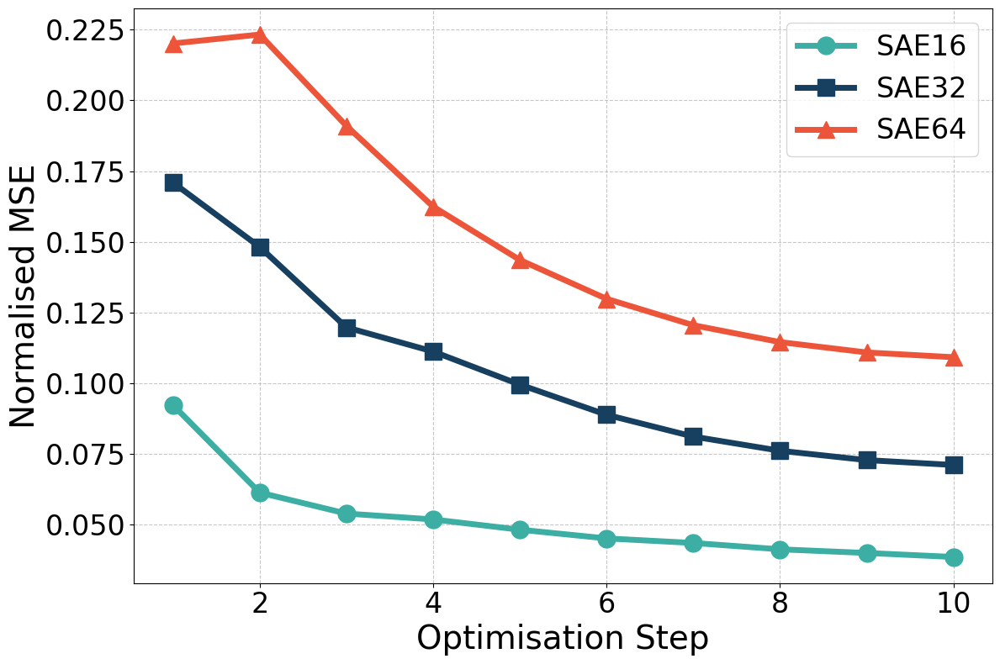

In [479]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Parameters for plot styling
FONT_SIZE = 28
LINE_WIDTH = 5
MARKER_SIZE = 15

def load_results(file_path):
    with open(file_path, "r") as f:
        return json.load(f)

def plot_average_mse_trajectory(results, font_size=FONT_SIZE, line_width=LINE_WIDTH):
    plt.figure(figsize=(12, 8))
    
    colors = ['#3CAEA3', '#173F5F', '#ED553B']  # New color scheme
    markers = ['o', 's', '^']  # Circle, Square, Triangle
    
    for (model_name, model_results), color, marker in zip(results.items(), colors, markers):
        mse_trajectories = [r['iterative']['mse_trajectory'] for r in model_results]
        avg_mse_trajectory = np.mean(mse_trajectories, axis=0)
        
        steps = range(1, len(avg_mse_trajectory) + 1)
        
        # Plot average MSE trajectory with markers
        plt.plot(steps, avg_mse_trajectory, marker=marker, linestyle='-', 
                 linewidth=line_width, markersize=MARKER_SIZE, color=color, 
                 label=f'SAE{model_name}')
    
    plt.xlabel("Optimisation Step", fontsize=font_size)
    plt.ylabel("Normalised MSE", fontsize=font_size)
    
    plt.xticks(fontsize=font_size-4)
    plt.yticks(fontsize=font_size-4)
    
    plt.legend(fontsize=font_size-4)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig("../output/iterative_optimisation.pdf", bbox_inches='tight')
    plt.show()

def main():
    results = load_results("../saerch/sae_data_csLG/intervention_results_multi_model.json")
    plot_average_mse_trajectory(results)

if __name__ == "__main__":
    main()

In [488]:
import torch
import torch.nn.functional as F
import numpy as np
from openai import OpenAI
import yaml
import json
from typing import Dict, Any, List, Tuple
from tqdm import tqdm
import random

# Assume FastAutoencoder is imported or defined elsewhere

def load_openai_client() -> OpenAI:
    with open('../config.yaml') as f:
        openai_key = yaml.safe_load(f)['openai_api_key']
    return OpenAI(api_key=openai_key)

def embed(text: str, client: OpenAI) -> np.ndarray:
    embedding = client.embeddings.create(input=[text], model='text-embedding-3-small').data[0].embedding
    return np.array(embedding, dtype=np.float32)

def load_feature_analysis(path: str) -> Dict[int, str]:
    with open(path, 'r') as f:
        data = json.load(f)
    return {x['index']: x['label'] for x in data}

def load_model(config: Dict[str, Any], device: torch.device) -> FastAutoencoder:
    model = FastAutoencoder(config['n_dirs'], config['d_model'], 
                            config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model.to(device)
    model.eval()
    return model

def load_abstracts(file_path: str) -> List[str]:
    with open(file_path, 'r') as f:
        return f.read().split('\n\n')

def normalize_mse(mse: float, original_latents: torch.Tensor) -> float:
    return mse / torch.mean(original_latents ** 2).item()

def optimize_latents_encoder(model: FastAutoencoder, 
                             original_latents: torch.Tensor,
                             target_feature: int,
                             steps: int = 10,
                             learning_rate: float = 0.001) -> Tuple[torch.Tensor, List[float]]:
    encoder = model.encoder
    latent_bias = model.latent_bias
    latents = original_latents.clone().detach().requires_grad_(True)
    
    optimizer = torch.optim.AdamW([latents], lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, steps, eta_min=0, last_epoch=-1)

    normalized_losses = []

    for _ in range(steps):
        optimizer.zero_grad()
        
        encoded = encoder(model.decoder(latents)) + latent_bias
        topk_values, topk_indices = torch.topk(encoded, k=model.k)
        new_latents = torch.zeros_like(encoded)
        new_latents.scatter_(-1, topk_indices, F.relu(topk_values))
        
        loss = F.mse_loss(new_latents, original_latents)
        normalized_loss = normalize_mse(loss.item(), original_latents)
        normalized_losses.append(normalized_loss)
        
        loss.backward()
        optimizer.step()
        scheduler.step()

    return latents, normalized_losses

def direct_intervention(original_latents: torch.Tensor, target_feature: int) -> torch.Tensor:
    modified_latents = original_latents.clone()
    modified_latents[target_feature] = 0
    return modified_latents

def calculate_metrics(original_latents: torch.Tensor, modified_latents: torch.Tensor, target_feature: int) -> Dict[str, float]:
    cosine_sim = F.cosine_similarity(original_latents.unsqueeze(0), modified_latents.unsqueeze(0)).item()
    original_rank = torch.argsort(original_latents, descending=True).tolist().index(target_feature)
    modified_rank = torch.argsort(modified_latents, descending=True).tolist().index(target_feature)
    non_target_change = torch.mean(torch.abs(original_latents - modified_latents)).item()
    
    return {
        "cosine_similarity": cosine_sim,
        "original_rank": original_rank,
        "modified_rank": modified_rank,
        "non_target_change": non_target_change
    }

def process_abstracts_for_model(abstracts: List[str], model: FastAutoencoder, client: OpenAI, device: torch.device) -> List[Dict[str, Any]]:
    results = []
    
    for abstract in tqdm(abstracts):
        abstract_embedding = torch.from_numpy(embed(abstract, client)).to(device)
        
        with torch.no_grad():
            output, info = model(abstract_embedding.unsqueeze(0))
            initial_latents = torch.zeros(model.n_dirs, device=device)
            initial_latents.scatter_(-1, info['topk_indices'].squeeze(), info['topk_values'].squeeze())
        
        # Randomly select one of the active features
        active_features = info['topk_indices'].squeeze().tolist()
        target_feature = random.choice(active_features)
        initial_latents[target_feature] = 100
        
        # Iterative Optimization
        optimized_latents, normalized_losses = optimize_latents_encoder(model, initial_latents, target_feature)
        optimized_metrics = calculate_metrics(initial_latents, optimized_latents, target_feature)
        
        # Direct Intervention
        direct_latents = direct_intervention(initial_latents, target_feature)
        direct_metrics = calculate_metrics(initial_latents, direct_latents, target_feature)
        
        results.append({
            "abstract": abstract,
            "target_feature": target_feature,
            "original_value": initial_latents[target_feature].item(),
            "iterative": {
                "final_mse": normalized_losses[-1],
                "mse_trajectory": normalized_losses,
                **optimized_metrics
            },
            "direct": {
                "final_mse": normalize_mse(F.mse_loss(direct_latents, initial_latents).item(), initial_latents),
                **direct_metrics
            }
        })
    
    return results

def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    client = load_openai_client()
    feature_analysis = load_feature_analysis("../saerch/sae_data_csLG/feature_analysis_results_64.json")
    
    abstracts = load_abstracts("../saerch/sae_data_csLG/test_queries.txt")
    
    model_configs = {
        '16': {
            'path': '../models/16_3072_32_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 3072,
            'k': 16,
            'auxk': 32
        },
        '32': {
            'path': '../models/32_6144_64_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 6144,
            'k': 32,
            'auxk': 64
        },
        '64': {
            'path': '../models/64_9216_128_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 1536 * 6,
            'k': 64,
            'auxk': 128
        }
    }
    
    all_results = {}
    
    for model_name, config in model_configs.items():
        print(f"Processing model: {model_name}")
        model = load_model(config, device)
        results = process_abstracts_for_model(abstracts, model, client, device)
        all_results[model_name] = results
    
    # Save results to a new file for later analysis and visualization
    with open("../saerch/sae_data_csLG/intervention_results_multi_model_active_to_zero.json", "w") as f:
        json.dump(all_results, f)

if __name__ == "__main__":
    main()

Processing model: 16


100%|██████████| 20/20 [00:07<00:00,  2.60it/s]


Processing model: 32


100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


Processing model: 64


100%|██████████| 20/20 [00:10<00:00,  1.83it/s]


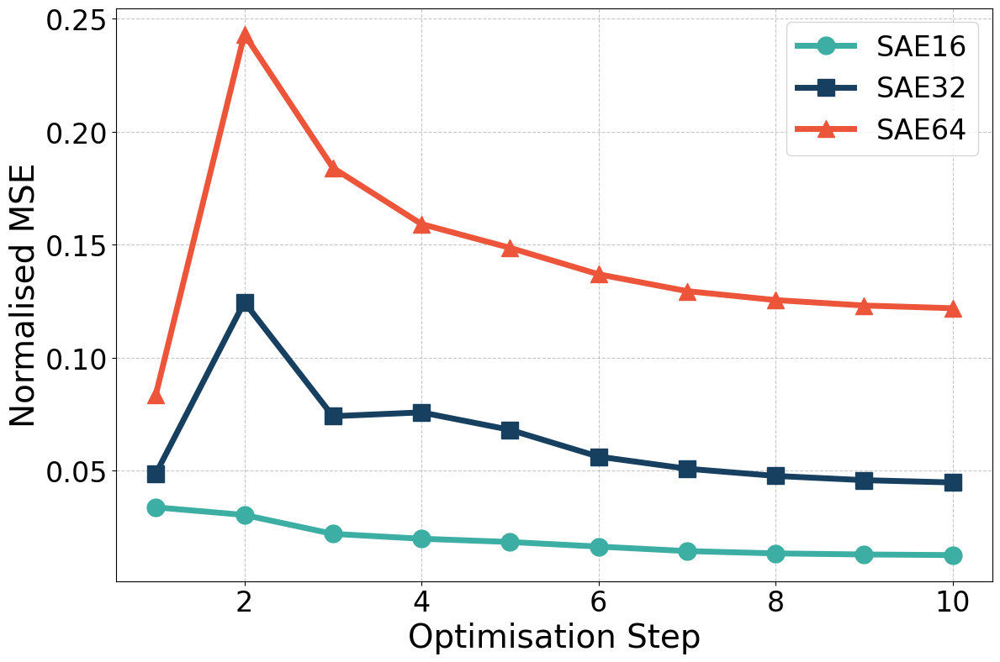

In [487]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Parameters for plot styling
FONT_SIZE = 28
LINE_WIDTH = 5
MARKER_SIZE = 15

def load_results(file_path):
    with open(file_path, "r") as f:
        return json.load(f)

def plot_average_mse_trajectory(results, font_size=FONT_SIZE, line_width=LINE_WIDTH):
    plt.figure(figsize=(12, 8))
    
    colors = ['#3CAEA3', '#173F5F', '#ED553B']  # New color scheme
    markers = ['o', 's', '^']  # Circle, Square, Triangle
    
    for (model_name, model_results), color, marker in zip(results.items(), colors, markers):
        mse_trajectories = [r['iterative']['mse_trajectory'] for r in model_results]
        avg_mse_trajectory = np.mean(mse_trajectories, axis=0)
        
        steps = range(1, len(avg_mse_trajectory) + 1)
        
        # Plot average MSE trajectory with markers
        plt.plot(steps, avg_mse_trajectory, marker=marker, linestyle='-', 
                 linewidth=line_width, markersize=MARKER_SIZE, color=color, 
                 label=f'SAE{model_name}')
    
    plt.xlabel("Optimisation Step", fontsize=font_size)
    plt.ylabel("Normalised MSE", fontsize=font_size)
    
    plt.xticks(fontsize=font_size-4)
    plt.yticks(fontsize=font_size-4)
    
    plt.legend(fontsize=font_size-4)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig("../output/iterative_optimisation_active_to_zero.pdf", bbox_inches='tight')
    plt.show()

def main():
    results = load_results("../saerch/sae_data_csLG/intervention_results_multi_model_active_to_zero.json")
    plot_average_mse_trajectory(results)

if __name__ == "__main__":
    main()

In [498]:
import torch
import torch.nn.functional as F
import numpy as np
from openai import OpenAI
import yaml
import json
from typing import Dict, Any, List, Tuple
from tqdm import tqdm
import random

# Assume FastAutoencoder is imported or defined elsewhere

def load_openai_client() -> OpenAI:
    with open('../config.yaml') as f:
        openai_key = yaml.safe_load(f)['openai_api_key']
    return OpenAI(api_key=openai_key)

def embed(text: str, client: OpenAI) -> np.ndarray:
    embedding = client.embeddings.create(input=[text], model='text-embedding-3-small').data[0].embedding
    return np.array(embedding, dtype=np.float32)

def load_model(config: Dict[str, Any], device: torch.device) -> FastAutoencoder:
    model = FastAutoencoder(config['n_dirs'], config['d_model'], 
                            config['k'], config['auxk'], multik=0)
    model.load_state_dict(torch.load(config['path'], map_location=device))
    model.to(device)
    model.eval()
    return model

def load_abstracts(file_path: str) -> List[str]:
    with open(file_path, 'r') as f:
        return f.read().split('\n\n')

def normalize_mse(mse: float, original_latents: torch.Tensor) -> float:
    return mse / torch.mean(original_latents ** 2).item()

def optimize_latents_encoder(model: FastAutoencoder, 
                             original_latents: torch.Tensor,
                             steps: int = 10,
                             learning_rate: float = 0.001) -> Tuple[torch.Tensor, float]:
    encoder = model.encoder
    latent_bias = model.latent_bias
    latents = original_latents.clone().detach().requires_grad_(True)
    
    optimizer = torch.optim.AdamW([latents], lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, steps, eta_min=0, last_epoch=-1)

    for _ in range(steps):
        optimizer.zero_grad()
        
        encoded = encoder(model.decoder(latents)) + latent_bias
        topk_values, topk_indices = torch.topk(encoded, k=model.k)
        new_latents = torch.zeros_like(encoded)
        new_latents.scatter_(-1, topk_indices, F.relu(topk_values))
        
        loss = F.mse_loss(new_latents, original_latents)
        loss.backward()
        optimizer.step()
        scheduler.step()

    final_loss = F.mse_loss(new_latents, original_latents)
    normalized_final_loss = normalize_mse(final_loss.item(), original_latents)
    return latents, normalized_final_loss

def process_abstract_for_model(abstract: str, model: FastAutoencoder, client: OpenAI, device: torch.device, a_values: List[int]) -> Dict[int, float]:
    abstract_embedding = torch.from_numpy(embed(abstract, client)).to(device)
    
    with torch.no_grad():
        output, info = model(abstract_embedding.unsqueeze(0))
        initial_latents = torch.zeros(model.n_dirs, device=device)
        initial_latents.scatter_(-1, info['topk_indices'].squeeze(), info['topk_values'].squeeze())

    # Calculate initial normalized MSE
    initial_mse = F.mse_loss(initial_latents, initial_latents)  # This will be 0
    initial_normalized_mse = normalize_mse(initial_mse.item(), initial_latents)

    results = {}
    
    for a in a_values:
        # Randomly select 'a' zero features
        zero_features = torch.where(initial_latents == 0)[0]
        if len(zero_features) < a:
            print(f"Warning: Not enough zero features for a={a}. Using all available zero features.")
            a = len(zero_features)
        selected_features = np.random.choice(zero_features.cpu().numpy(), size=a, replace=False)
        
        # Set selected features to active
        modified_latents = initial_latents.clone()
        modified_latents[selected_features] = torch.abs(torch.rand(a, device=device))  # Random positive values
        
        # Run optimization
        _, final_normalized_mse = optimize_latents_encoder(model, modified_latents)
        
        # Calculate percent improvement
        try:
            percent_improvement = ((initial_normalized_mse - final_normalized_mse) / initial_normalized_mse) * 100
        except ZeroDivisionError:
            percent_improvement = 0.0
        
        results[a] = percent_improvement
    
    return results

def process_abstracts_for_model(abstracts: List[str], model: FastAutoencoder, client: OpenAI, device: torch.device, a_values: List[int]) -> List[Dict[int, float]]:
    results = []
    for abstract in tqdm(abstracts):
        result = process_abstract_for_model(abstract, model, client, device, a_values)
        results.append(result)
    return results

def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    client = load_openai_client()
    
    abstracts = load_abstracts("../saerch/sae_data_csLG/test_queries.txt")
    
    model_configs = {
        '16': {
            'path': '../models/16_3072_32_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 3072,
            'k': 16,
            'auxk': 32
        },
        '32': {
            'path': '../models/32_6144_64_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 6144,
            'k': 32,
            'auxk': 64
        },
        '64': {
            'path': '../models/64_9216_128_auxk_csLG_epoch_88.pth',
            'd_model': 1536,
            'n_dirs': 1536 * 6,
            'k': 64,
            'auxk': 128
        }
    }
    
    a_values = [1, 2, 4, 8, 16, 32, 64]
    all_results = {}
    
    for model_name, config in model_configs.items():
        print(f"Processing model: {model_name}")
        model = load_model(config, device)
        results = process_abstracts_for_model(abstracts, model, client, device, a_values)
        all_results[model_name] = results
    
    # Save results to a new file for later analysis and visualization
    with open("../saerch/sae_data_csLG/intervention_results_multi_model_varying_a_percent_improvement.json", "w") as f:
        json.dump(all_results, f)

if __name__ == "__main__":
    main()

Processing model: 16


100%|██████████| 20/20 [00:24<00:00,  1.23s/it]


Processing model: 32


100%|██████████| 20/20 [00:40<00:00,  2.05s/it]


Processing model: 64


100%|██████████| 20/20 [00:54<00:00,  2.72s/it]


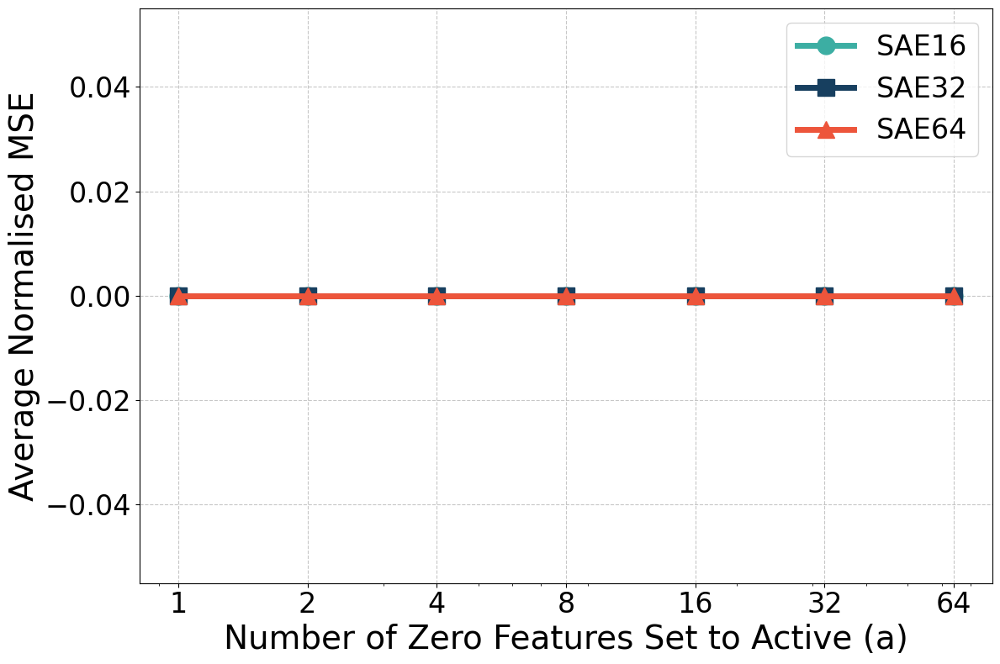

In [500]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Parameters for plot styling
FONT_SIZE = 28
LINE_WIDTH = 5
MARKER_SIZE = 15

def load_results(file_path):
    with open(file_path, "r") as f:
        return json.load(f)

def plot_average_mse_vs_a(results, font_size=FONT_SIZE, line_width=LINE_WIDTH):
    plt.figure(figsize=(12, 8))
    
    colors = ['#3CAEA3', '#173F5F', '#ED553B']  # Color scheme
    markers = ['o', 's', '^']  # Circle, Square, Triangle
    
    for (model_name, model_results), color, marker in zip(results.items(), colors, markers):
        a_values = sorted([int(a) for a in model_results[0].keys()])  # Convert to int before sorting
        avg_mse_values = []
        
        for a in a_values:
            mse_values = [r[str(a)] for r in model_results]
            avg_mse = np.mean(mse_values)
            avg_mse_values.append(avg_mse)
        
        # Plot average MSE vs a with markers
        plt.plot(a_values, avg_mse_values, marker=marker, linestyle='-', 
                 linewidth=line_width, markersize=MARKER_SIZE, color=color, 
                 label=f'SAE{model_name}')
    
    plt.xlabel("Number of Zero Features Set to Active (a)", fontsize=font_size)
    plt.ylabel("Average Normalised MSE", fontsize=font_size)
    
    plt.xscale('log')  # Use log scale for x-axis
    plt.xticks(a_values, [str(a) for a in a_values], fontsize=font_size-4)
    plt.yticks(fontsize=font_size-4)
    
    plt.legend(fontsize=font_size-4)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig("../output/mse_vs_a_zero_to_active.pdf", bbox_inches='tight')
    plt.show()

def main():
    results = load_results("../saerch/sae_data_csLG/intervention_results_multi_model_varying_a_percent_improvement.json")
    plot_average_mse_vs_a(results)

if __name__ == "__main__":
    main()

In [3]:
import json

path = "../saerch/sae_data_csLG/feature_analysis_results_32.json"

with open(path, 'r') as f:
    data = json.load(f)

max_index = max([x['index'] for x in data])
# Print out everything missing between 0 and max_index
missing_indices = set(range(max_index + 1)) - set([x['index'] for x in data])
missing_indices

{123, 150, 1151, 1282, 1283, 1968, 3047, 3374, 3378}

## Weights analysis

In [92]:
import sys 
sys.path.append('../saerch')
from topk_sae import FastAutoencoder
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np

# Load the 64 model
config = {
    '64': {
        'path': '../models/64_9216_128_auxk_csLG_epoch_88.pth', #'../models/64_9216_128_auxk_epoch_50.pth',
        'd_model': 1536,
        'n_dirs': 1536 * 6,
        'k': 64,
        'auxk': 128
    }
}

# Turn grad off
torch.set_grad_enabled(False)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = FastAutoencoder(config['64']['n_dirs'], config['64']['d_model'],  config['64']['k'], config['64']['auxk'], multik=0)
model.load_state_dict(torch.load(config['64']['path'], map_location=device))

<All keys matched successfully>

In [93]:
model.decoder.weight.shape

torch.Size([1536, 9216])

In [94]:
model.encoder.weight.shape

torch.Size([9216, 1536])

In [95]:
# We want the cosine similarity between the encoder rows and the decoder columns
e = model.encoder.weight
d = model.decoder.weight
cosine_sims = e @ d / (torch.norm(e, dim=1)[:, None] * torch.norm(d, dim=0)[None, :])
# Get diagonal
cosine_sims_diag = cosine_sims.diag()
cosine_sims_diag

tensor([0.4846, 0.5588, 0.6369,  ..., 0.5556, 0.5136, 0.5372])

In [96]:
cos = nn.CosineSimilarity(dim=1)
cosine_sims_diag = cos(e, d.T)

In [97]:
import plotly.express as px

fig = px.histogram(x=cosine_sims_diag.detach().cpu().numpy(), nbins=100, width=800)
fig.update_xaxes(title_text="Cosine Similarity")
fig.update_yaxes(title_text="")
# Vertical red line for the mean with a width of 5
fig.add_vline(x=cosine_sims_diag.mean().item(), line_dash="dash", line_color="red", line_width=5)
# Make the font bigger
fig.update_layout(font=dict(size=24))
# Save figure
fig.write_image("../output/cosine_similarity_histogram_decoder_encoder.pdf")
fig.show()

In [98]:
# Argsort the indices
sorted_indices = torch.argsort(cosine_sims_diag, descending=True)
# Get associated cosine sims
sorted_cosine_sims = cosine_sims_diag[sorted_indices]
# Print top 10 indices and sims
top_10_indices = sorted_indices[:10].tolist()
top_10_cosine_sims = sorted_cosine_sims[:10].tolist()
for index, sim in zip(top_10_indices, top_10_cosine_sims):
    print(f"Index: {index}, Cosine Similarity: {sim:.4f}")

Index: 8062, Cosine Similarity: 0.8022
Index: 3924, Cosine Similarity: 0.7794
Index: 4999, Cosine Similarity: 0.7773
Index: 7536, Cosine Similarity: 0.7735
Index: 4108, Cosine Similarity: 0.7652
Index: 4966, Cosine Similarity: 0.7632
Index: 395, Cosine Similarity: 0.7602
Index: 2192, Cosine Similarity: 0.7585
Index: 7925, Cosine Similarity: 0.7571
Index: 7431, Cosine Similarity: 0.7555


In [100]:
# Load the feature results
import json

path = "../saerch/sae_data_csLG/feature_analysis_results_64.json"

with open(path, 'r') as f:
    data = json.load(f)

In [101]:
index = 8062
feature = next(x for x in data if x['index'] == index)
feature

{'index': 8062,
 'label': 'First-order optimization in ML',
 'reasoning': '### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, the following specific computer science concepts are identified:\n\n1. **First-Order Optimization Methods**:\n   - Stochastic first-order methods\n   - Decentralized first-order methods\n   - Accelerated first-order optimization\n   - First-order surrogate functions\n   - First-order meta-learning algorithms\n   - First-order methods for robust MDPs\n   - Comparison of first-order algorithms\n   - Adaptive first-order algorithms\n\n2. **Machine Learning Algorithms**:\n   - Character-level machine learning\n   - Various machine learning models (e.g., extra trees, KNN, Naive Bayes, SVM, random forest, gradient boosting, light GBM, logistic regression, ridge classifier, MLP, RNN, GRU, CNN, BiLSTM)\n\n3. **Optimization Techniques**:\n   - Convergence rates\n   - Surrogate functions\n   - Incr

In [102]:
index = 3924
feature = next(x for x in data if x['index'] == index)
feature

{'index': 3924,
 'label': '3D Deep Learning',
 'reasoning': '### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, here are the potential topics, concepts, themes, methodologies, and features that they share in common:\n\n1. **3D Deep Learning**:\n   - E3x: $\\mathrm{E}(3)$-Equivariant Deep Learning Made Easy\n   - Accelerating 3D Deep Learning with PyTorch3D\n   - ATOM3D: Tasks On Molecules in Three Dimensions\n   - Medical Image Segmentation with 3D Convolutional Neural Networks: A Survey\n\n2. **Ensemble Methods**:\n   - The Three Ensemble Clustering (3EC) Algorithm for Pattern Discovery in Unsupervised Learning\n\n3. **Support Vector Machines (SVMs)**:\n   - L$^3$-SVMs: Landmarks-based Linear Local Support Vectors Machines\n\n4. **Neural Networks and Deep Learning**:\n   - E3x: $\\mathrm{E}(3)$-Equivariant Deep Learning Made Easy\n   - Accelerating 3D Deep Learning with PyTorch3D\n   - Deep Voice 3: Scaling Tex

In [103]:
index = 4999
feature = next(x for x in data if x['index'] == index)
feature

{'index': 4999,
 'label': 'Generalisation and domain adaptation',
 'reasoning': "### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, here are the potential topics, concepts, themes, methodologies, and features:\n\n1. **Domain Adaptation and Generalisation**:\n   - Domain adaptation\n   - Generalisation error\n   - Out-of-distribution generalisation\n   - Imprecise learning\n   - Transfer learning\n\n2. **Optimisation Techniques**:\n   - Push GP\n   - Continuous-valued problems\n   - Novel optimisation strategies\n   - Gradient descent\n   - Learning rate schedules\n   - Regularisation techniques\n\n3. **Neural Network Training and Regularisation**:\n   - Fine-tuning of deep neural networks\n   - Rademacher complexity\n   - Distance-based regularisation\n   - Smoothness regularisation\n   - Spectral normalisation\n\n4. **Probabilistic and Statistical Methods**:\n   - Normalising flows\n   - Multivariate Student's 

In [104]:
index = 7536
feature = next(x for x in data if x['index'] == index)
feature

{'index': 7536,
 'label': 'Clustering algorithms and enhancements',
 'reasoning': '### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, the following specific computer science concepts are identified:\n\n1. **Clustering Algorithms**:\n   - K-means\n   - K+ Means\n   - KSG mutual information estimator\n   - k2-means\n   - K-Tensors\n   - TiK-means\n   - K-modes\n   - K-medoids\n   - Boost K-Means\n\n2. **Clustering Enhancements and Variants**:\n   - Enhancements over K-means (e.g., K+ Means, k2-means, TiK-means)\n   - Exact algorithms for clustering (e.g., EKM for K-medoids)\n   - Clustering for specific data types (e.g., K-Tensors for PSD matrices)\n\n3. **Clustering Methodologies**:\n   - Determining the number of clusters (e.g., "k is the Magic Number")\n   - Initialization strategies (e.g., divisive initialization in k2-means)\n   - Convergence analysis (e.g., KSG estimator, KL entropy estimator)\n\n4. **Applic

In [105]:
# Get max cosine sims for each index in decoder
cosine_sims_decoder = d.T @ d# / (torch.norm(d, dim=0)[:, None] * torch.norm(d, dim=0)[None, :])

# Set everything on the diag to 0
cosine_sims_decoder.fill_diagonal_(0)

# Max from each row
max_cosine_sims_decoder, max_cosine_sims_indices_decoder = torch.max(cosine_sims_decoder, dim=0)

max_cosine_sims_decoder, max_cosine_sims_indices_decoder

(tensor([0.4362, 0.2838, 0.3074,  ..., 0.2443, 0.2861, 0.2710]),
 tensor([5083, 6708, 5320,  ..., 2586,  642, 3408]))

In [106]:
cosine_sims_diag

tensor([0.4846, 0.5588, 0.6369,  ..., 0.5556, 0.5136, 0.5372])

In [107]:
# Scatter plot of max_cosine_sims_decoder against cosine_sims_diag
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression

# Extract necessary data
indices = [item['index'] for item in data]
densities = [item['density'] for item in data]

fig = go.Figure(data=go.Scatter(
    x=max_cosine_sims_decoder.detach().cpu().numpy(),
    y=cosine_sims_diag.detach().cpu().numpy(),
    mode='markers'
))

fig.update_layout(
    xaxis_title="Max Decoder Cosine Similarity",
    yaxis_title="Cosine Similarity with Encoder",
    width=800,
    height=600,
    font=dict(size=24),
    showlegend=False
)

# Fit a line to the data
x = max_cosine_sims_decoder.unsqueeze(1)
y = cosine_sims_diag.unsqueeze(1)
reg = LinearRegression().fit(x.cpu().detach().numpy(), y.cpu().detach().numpy())
y_pred = reg.predict(x.detach().cpu().numpy())

# Print stats of fit
print(f"R^2: {reg.score(x.cpu().detach().numpy(), y.cpu().detach().numpy())}")
print(f"Slope: {reg.coef_[0][0]}")
print(f"Intercept: {reg.intercept_[0]}")

fig.add_trace(go.Scatter(
    x=x.detach().squeeze().cpu().numpy(),
    y=y_pred.squeeze(),
    mode='lines',
    line=dict(color='red', width=3)
))

# Save figure
fig.write_image("../output/cosine_similarity_encoder_decoder_scatter.pdf")

fig.show()

R^2: 0.004086971282958984
Slope: -0.04619373381137848
Intercept: 0.5864337682723999


In [51]:
px.histogram(x=max_cosine_sims_decoder.detach().cpu().numpy(), nbins=100, title="Max Cosine Similarity Distribution", width=800)

## Check topk indices and values

In [30]:
# Load topk indices
import numpy as np

# Indices
# path = "../saerch/sae_data_csLG/topk_indices_16_3072.npy"
path = "../saerch/sae_data_csLG/topk_indices_16.npy"
topk_indices = np.load(path)

# Values
# path = "../saerch/sae_data_csLG/topk_values_16_3072.npy"
path = "../saerch/sae_data_csLG/topk_indices_16.npy"
topk_values = np.load(path)

# Load the feature results
import json

path = "../saerch/sae_data_csLG/feature_analysis_results_16.json"

with open(path, 'r') as f:
    feature_analysis = json.load(f)

# Load the abstract texts
path = "../data/vector_store_csLG/abstract_texts.json"

with open(path, 'r') as f:
    abstract_texts = json.load(f)

# Load the abstract embeddings
import torch

# Load the embeddings
path = "../data/vector_store_csLG/abstract_embeddings.npy"
abstract_embeddings = torch.from_numpy(np.load(path))

In [31]:
def get_feature_activations(topk_indices, topk_values, abstract_texts, embeddings, m: int, min_length: int = 100, feature_index = None):

    if isinstance(feature_index, list):
        feature_mask = np.isin(topk_indices, feature_index)
    else:
        feature_mask = topk_indices == feature_index
    
    doc_ids = abstract_texts['doc_ids']
    abstracts = abstract_texts['abstracts']
    
    
    activated_indices = np.where(feature_mask.any(axis=1))[0]
    activation_values = np.where(feature_mask, topk_values, 0).max(axis=1)
    
    sorted_activated_indices = activated_indices[np.argsort(-activation_values[activated_indices])]
    
    top_m_abstracts = []
    top_m_indices = []
    for i in sorted_activated_indices:
        if len(abstracts[i]) > min_length:
            top_m_abstracts.append((doc_ids[i], abstracts[i], activation_values[i]))
            top_m_indices.append(i)
        if len(top_m_abstracts) == m:
            break
    
    if len(top_m_indices) == 0:
        return [], []

    zero_activation_indices = np.where(~feature_mask.any(axis=1))[0]
    zero_activation_samples = []
    active_embedding = np.array([embeddings[i] for i in top_m_indices])
    active_embedding = active_embedding.mean(axis = 0) 
    cosine_similarities = np.dot(active_embedding, embeddings[zero_activation_indices].T)
    cosine_pairs = [(index, cosine_similarities[i]) for i, index in enumerate(zero_activation_indices)]
    cosine_pairs.sort(key=lambda x: -x[1])
    
    for i, cosine_sim in cosine_pairs:
        if len(abstracts[i]) > min_length:
            zero_activation_samples.append((doc_ids[i], abstracts[i], 0))
        if len(zero_activation_samples) == m:
            break
    
    return top_m_abstracts, zero_activation_samples

In [32]:
feature_analysis

[{'index': 0,
  'label': 'Sports motion analysis with ML/CV',
  'reasoning': '### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, the following specific computer science concepts, themes, and methodologies are identified:\n\n1. **Sports Analytics**:\n   - Player re-identification\n   - Sprint classification\n   - Running style classification\n   - Athlete tracking and identification\n   - Game state reconstruction\n\n2. **Deep Learning and Machine Learning**:\n   - Deep learning frameworks\n   - Reinforcement learning\n   - Convolutional Neural Networks (CNN)\n   - Long Short-Term Memory (LSTM)\n   - Set Transformers\n   - Triplet networks\n   - Unsupervised learning\n   - Supervised classification\n\n3. **Computer Vision**:\n   - Pose estimation\n   - Optical flow\n   - YOLO (You Only Look Once) models\n   - EfficientNet\n   - Video-based event stream data\n   - Motion tracking and analysis\n\n4. **Human Motion 

In [33]:
[x for x in feature_analysis if 'Economic Models' in x['label']]

[{'index': 379,
  'label': 'Machine Learning in Economic Models',
  'reasoning': '### Step 1: Identify Potential Topics, Concepts, Themes, Methodologies, and Features\n\nBased on the max-activating examples, the following topics, concepts, themes, methodologies, and features are identified:\n\n1. **Economic Models and Theories**:\n   - Monetary policy regime change\n   - Economic aggregators (CES, Cobb-Douglas)\n   - GDP per capita trajectories\n   - Revealed preferences\n   - Utility functions\n   - Economic parameters\n   - Income data credibility\n\n2. **Machine Learning and AI in Economics**:\n   - Deep reinforcement learning\n   - Survival analysis\n   - DeepSurv\n   - Learning algorithms for revealed preferences\n   - Variational Bayesian Inference\n   - Structural regularization\n   - Hierarchical correlation reconstruction (HCR)\n\n3. **Data Analysis and Statistical Methods**:\n   - Polynomial sample-complexity\n   - Conditional probability distribution\n   - Orthonormal polyno

In [34]:
index = 379

top_m_abstracts, zero_activation_samples = get_feature_activations(topk_indices, topk_values, abstract_texts, abstract_embeddings, 5, feature_index=index)

for doc_id, abstract, activation in top_m_abstracts:
    print(f"Doc ID: {doc_id}, Activation: {activation:.4f}")
    print(abstract)
    print()

/var/folders/wg/cdt_cw_5265_z_gwnxlf0tv80000gn/T/ipykernel_79303/2785163407.py:33: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  cosine_similarities = np.dot(active_embedding, embeddings[zero_activation_indices].T)


Doc ID: 0412106, Activation: 379.0000
Online Learning of Aggregate Knowledge about Non-linear Preferences
  Applied to Negotiating Prices and Bundles

In this paper, we consider a form of multi-issue negotiation where a shop negotiates both the contents and the price of bundles of goods with his customers. We present some key insights about, as well as a procedure for, locating mutually beneficial alternatives to the bundle currently under negotiation. The essence of our approach lies in combining aggregate (anonymous) knowledge of customer preferences with current data about the ongoing negotiation process. The developed procedure either works with already obtained aggregate knowledge or, in the absence of such knowledge, learns the relevant information online. We conduct computer experiments with simulated customers that have_nonlinear_ preferences. We show how, for various types of customers, with distinct negotiation heuristics, our procedure (with and without the necessary aggrega

## Families

In [1]:
import sys
sys.path.append('../saerch')
import family
import torch
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import json

mode = 'csLG_epoch'
SAE_DATA_DIR = '../saerch/sae_data_{}/'.format('csLG')
DATA_DIR = '../data/vector_store_csLG/'
abstract_embeddings = np.load(DATA_DIR + "/abstract_embeddings.npy")
abstract_embeddings = abstract_embeddings.astype(np.float32)
abstract_texts = json.load(open(DATA_DIR + '/abstract_texts.json'))['abstracts']
dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
dataloader = DataLoader(dataset, batch_size=1024, shuffle=False)
num_abstracts = len(abstract_embeddings)
model_16_c = family.Model(sae_data_dir = SAE_DATA_DIR, model_path = '../models/16_3072_32_auxk_{}_88.pth'.format(mode),
                       autointerp_results = 'feature_analysis_results_16.json', dataloader = dataloader, num_abstracts = num_abstracts)
model_32_c = family.Model(sae_data_dir = SAE_DATA_DIR, model_path = '../models/32_6144_64_auxk_{}_88.pth'.format(mode),
                        autointerp_results = 'feature_analysis_results_32.json', dataloader = dataloader, num_abstracts = num_abstracts)
model_64_c = family.Model(sae_data_dir = SAE_DATA_DIR, model_path = '../models/64_9216_128_auxk_{}_88.pth'.format(mode),
                           autointerp_results = 'feature_analysis_results_64.json', dataloader = dataloader, num_abstracts = num_abstracts)
families_64_c = model_64_c.load_all_families(n = 2)
families_32_c = model_32_c.load_all_families(n = 2)
families_16_c = model_16_c.load_all_families(n = 2)

Generating matrix and norms...
153146 3072
153146 3072
Generating matrix and norms...
153146 6144
153146 6144
Generating matrix and norms...
153146 9216
153146 9216
No saved families found. Generating...
Deduplicated 26 families
No saved families found. Generating...
Deduplicated 4 families
No saved families found. Generating...
Deduplicated 2 families


In [4]:
import json

path = '../saerch/sae_data_csLG/clean_families_64_9216.json'

with open(path, 'r') as f:
    clean_families_16 = json.load(f)

In [5]:
clean_families_16

{'Federated Learning and Privacy Concerns': {'parent': ['Federated Learning and Privacy Concerns',
   11],
  'children': [['Federated learning methodologies and challenges', 1746],
   ['Federated Learning methodologies', 3356],
   ['Federated Learning Algorithms and Analysis', 505],
   ['Federated Learning Optimization and Security', 6642],
   ['Federated learning and privacy preservation', 3703],
   ['Federated Learning Client Selection', 674],
   ['Federated Learning and its methodologies', 2877],
   ['"Flip" in machine learning contexts', 6959],
   ['Vertical Federated Learning (VFL)', 1202],
   ['Participation in federated learning', 4944]]},
 'Graph Neural Networks and Learning': {'parent': ['Graph Neural Networks and Learning',
   8],
  'children': [['Graph Neural Networks (GNNs)', 4203],
   ['Heterophily in Graph Neural Networks', 7706],
   ['Vertex-related neural network methods', 2339],
   ['Graph-based semi-supervised learning', 8798],
   ['Mondrian Process in Machine Learnin

## Feature family stats

In [24]:
import json
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
import torch
import family

def get_membership_fraction(interp, model):
    clean_interp = [fam for fam in interp if fam['family_f1'] >= 0.8 and fam['family_pearson'] >= 0.8]
    family_index = {key: [] for key in model.clean_labels.keys()}
    
    for fam in clean_interp:
        for feature in fam['feature_names']:
            if feature in family_index.keys():
                family_index[feature].append(fam['superfeature'])
            else:
                print(feature)
    
    total = len(model.clean_labels.keys())
    in_a_family = 0
    for key in family_index.keys():
        if len(family_index[key]) > 0:
            in_a_family += 1
    
    return in_a_family / total

def block_diagonalize(model, interp):
    index_order = []
    family_lengths = []
    seen = set()

    for fam in interp:
        family_indices = []
        for feature in fam['feature_names']:
            index = model.clean_labels[feature]['index']
            if index not in seen:
                family_indices.append(index)
                seen.add(index)
        
        if family_indices == []:
            continue
        index_order.extend(family_indices)
        
        if len(family_lengths) == 0:
            family_lengths.append(len(family_indices))
        else:
            family_lengths.append(family_lengths[-1] + len(family_indices))
    
    index_order = list(dict.fromkeys(index_order))
    missing = [i for i in model.clean_labels_by_id.keys() if i not in index_order]

    for i in missing:
        index_order.append(i)
        family_lengths.append(family_lengths[-1] + 1)

    return index_order, family_lengths, seen

def compute_block_ratio(matrix, block_lengths):
    block_elements = []
    offdiag_elements = []
    for i in range(len(block_lengths) - 1):
        block = matrix[block_lengths[i]:block_lengths[i + 1], block_lengths[i]:block_lengths[i + 1]]
        offdiag_below = matrix[block_lengths[i]:block_lengths[i + 1], :block_lengths[i]]
        offdiag_above = matrix[block_lengths[i]:block_lengths[i + 1], block_lengths[i + 1]:]
        offdiag = np.concatenate((offdiag_below, offdiag_above), axis = 1)
        
        block_elements.extend(block.flatten())
        offdiag_elements.extend(offdiag.flatten())
    
    return np.mean(block_elements) / np.mean(offdiag_elements)
    # return np.sum(block_elements) / np.sum(matrix)

def get_child_mean(interp):
    child_f1s = []
    child_pearsons = []
    
    for fam in interp:
        child_f1s.extend(fam['feature_f1'])
        child_pearsons.extend(fam['feature_pearson'])
    
    return np.mean(child_f1s), np.mean(child_pearsons)

# def get_family_stats(clean_families, interp, model, verbose=True):
#     size = [len(clean_families[fam].children) for fam in clean_families]
#     if verbose: print('mean family size', round(np.mean(size), 2))
    
#     if verbose: print('f1', round(np.nanmean([fam['family_f1'] for fam in interp]), 2))
#     if verbose: print('pearson', round(np.nanmean([fam['family_pearson'] for fam in interp]), 2))
    
#     cooc_ratio = [clean_families[fam].matrix(model, mode='cooc') for fam in clean_families]
#     cooc_ratio = [ratio for ratio in cooc_ratio if not np.isinf(ratio)]
#     if verbose: print('mean cooc ratio', round(np.mean(cooc_ratio), 2))

#     index_order, block_lengths, seen = block_diagonalize(model, interp)
#     mat_base = model.mat.copy()
#     mat_base /= np.minimum.outer(model.norms, model.norms)
#     mat_perm = mat_base[index_order][:, index_order]
#     random_perm = np.random.permutation(mat_base.shape[0])
#     if verbose: print('cooc block diagonal', round(compute_block_ratio(mat_perm, block_lengths), 2))
#     if verbose: print('random block diagonal', round(compute_block_ratio(mat_base[random_perm][:, random_perm], block_lengths), 2))
    
#     act_base = model.actsims.copy()
#     act_perm = act_base[index_order][:, index_order]
#     if verbose: print('actsim block diagonal', round(compute_block_ratio(act_perm, block_lengths), 2))
#     if verbose: print('random block diagonal', round(compute_block_ratio(act_base[random_perm][:, random_perm], block_lengths), 2))

#     if verbose: print('membership fraction', round(get_membership_fraction(interp, model), 2))

#     # Print column names
#     print('mean family size', '&', 'f1', '&', 'pearson', '&', 'cooc ratio', '&', 'cooc block diagonal', '&', 'actsim block diagonal', '&', 'membership fraction')
    
#     # Print values in the same row
#     print('\\hline')
#     print(round(np.mean(size), 2), '&', round(np.nanmean([fam['family_f1'] for fam in interp]), 2), '&', round(np.nanmean([fam['family_pearson'] for fam in interp]), 2), '&', round(np.mean(cooc_ratio), 2), '&', round(compute_block_ratio(mat_perm, block_lengths), 2), '&', round(compute_block_ratio(act_perm, block_lengths), 2), '&', round(get_membership_fraction(interp, model), 2), '\\\\')

def get_family_stats(clean_families, interp, model, verbose=False):
    size = [len(clean_families[fam].children) for fam in clean_families]
    mean_size = round(np.mean(size), 2)
    
    mean_f1 = round(np.nanmean([fam['family_f1'] for fam in interp]), 2)
    mean_pearson = round(np.nanmean([fam['family_pearson'] for fam in interp]), 2)
    
    cooc_ratio = [clean_families[fam].matrix(model, mode='cooc') for fam in clean_families]
    cooc_ratio = [ratio for ratio in cooc_ratio if not np.isinf(ratio)]
    mean_cooc_ratio = round(np.mean(cooc_ratio), 2)

    index_order, block_lengths, seen = block_diagonalize(model, interp)
    mat_base = model.mat.copy()
    mat_base /= np.minimum.outer(model.norms, model.norms)
    mat_perm = mat_base[index_order][:, index_order]
    cooc_block = round(compute_block_ratio(mat_perm, block_lengths), 2)
    
    act_base = model.actsims.copy()
    act_perm = act_base[index_order][:, index_order]
    actsim_block = round(compute_block_ratio(act_perm, block_lengths), 2)

    membership_fraction = round(get_membership_fraction(interp, model), 2)

    if verbose:
        print(f"Mean family size: {mean_size}")
        print(f"Mean F1: {mean_f1}")
        print(f"Mean Pearson: {mean_pearson}")
        print(f"Mean co-occurrence ratio: {mean_cooc_ratio}")
        print(f"Co-occurrence block diagonal: {cooc_block}")
        print(f"Activation similarity block diagonal: {actsim_block}")
        print(f"Membership fraction: {membership_fraction}")

    # Print the column names
    # print("\\hline")
    # print("\\textbf{Mean Size} & \\textbf{Mean F1} & \\textbf{Mean Pearson} & \\textbf{Co-Oc. Ratio} & \\textbf{Co-oc. Block} & \\textbf{Act. Sim. Block} & \\textbf{$f_{inc}$} \\\\")

    # Print the row for the LaTeX table
    print(f"{mean_size} & {mean_f1} & {mean_pearson} & {mean_cooc_ratio} & {cooc_block} & {actsim_block} & {membership_fraction} \\\\")

def main():
    ns = [3072, 6144, 9216]
    ks = [16, 32, 64]
    auxks = [32, 64, 128]
    SAE_DATA_DIR = '../saerch/sae_data_csLG/'
    
    mode = 'csLG_epoch'
    SAE_DATA_DIR = '../saerch/sae_data_{}/'.format('csLG')
    
    DATA_DIR = '../data/vector_store_csLG/'
    abstract_embeddings = np.load(DATA_DIR + "/abstract_embeddings.npy")
    abstract_embeddings = abstract_embeddings.astype(np.float32)

    dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
    dataloader = DataLoader(dataset, batch_size=1024, shuffle=False)
    num_abstracts = len(abstract_embeddings)
    
    interps = []
    models = []
    clean_families = []
    for n, k, auxk in zip(ns, ks, auxks):
        interps.append(json.load(open(SAE_DATA_DIR + 'family_analysis_{}_{}.json'.format(k, n))))
        model = family.Model(sae_data_dir = SAE_DATA_DIR, model_path = '../models/{}_{}_{}_auxk_{}_88.pth'.format(k, n, auxk, mode),
                                   autointerp_results='feature_analysis_results_{}.json'.format(k), dataloader = dataloader, num_abstracts = num_abstracts)
        clean_families.append(model.load_all_families())
        models.append(model)
    
    # Print the table header
    print("\\begin{tabular}{lccccccccc}")
    print("\\hline")
    print("\\textbf{Dataset} & ($k$, $n$) & \\textbf{Mean Size} & \\textbf{Mean F1} & \\textbf{Mean Pearson} & \\textbf{Co-Oc. Ratio} & \\textbf{Co-oc. Block} & \\textbf{Act. Sim. Block} & \\textbf{$f_{inc}$} \\\\")
    print("\\hline")
    
    for i, interp in enumerate(interps):
        get_family_stats(clean_families[i], interp, models[i], ks[i], ns[i])
    
    print("\\hline")
    print("\\end{tabular}")

def main():
    ns = [3072, 6144, 9216]
    ks = [16, 32, 64]
    auxks = [32, 64, 128]
    SAE_DATA_DIR = '../saerch/sae_data_csLG/'
    
    mode = 'csLG_epoch'
    SAE_DATA_DIR = '../saerch/sae_data_{}/'.format('csLG')
    
    DATA_DIR = '../data/vector_store_csLG/'
    abstract_embeddings = np.load(DATA_DIR + "/abstract_embeddings.npy")
    abstract_embeddings = abstract_embeddings.astype(np.float32)

    dataset = TensorDataset(torch.from_numpy(abstract_embeddings))
    dataloader = DataLoader(dataset, batch_size=1024, shuffle=False)
    num_abstracts = len(abstract_embeddings)
    
    interps = []
    models = []
    clean_families = []
    for n, k, auxk in zip(ns, ks, auxks):
        interps.append(json.load(open(SAE_DATA_DIR + 'family_analysis_{}_{}.json'.format(k, n))))
        model = family.Model(sae_data_dir = SAE_DATA_DIR, model_path = '../models/{}_{}_{}_auxk_{}_88.pth'.format(k, n, auxk, mode),
                                   autointerp_results='feature_analysis_results_{}.json'.format(k), dataloader = dataloader, num_abstracts = num_abstracts)
        clean_families.append(model.load_all_families())
        models.append(model)
    
    for i, interp in enumerate(interps):
        get_family_stats(clean_families[i], interp, models[i], verbose = True)

In [25]:
main()

153146 3072
153146 3072
153146 6144
153146 6144
153146 9216
153146 9216


/var/folders/wg/cdt_cw_5265_z_gwnxlf0tv80000gn/T/ipykernel_80043/3865753196.py:128: RuntimeWarning: invalid value encountered in divide
  mat_base /= np.minimum.outer(model.norms, model.norms)


Mean family size: 6.79
Mean F1: 0.74
Mean Pearson: 0.52
Mean co-occurrence ratio: 3.0
Co-occurrence block diagonal: 17.489999771118164
Activation similarity block diagonal: 35.95000076293945
Membership fraction: 0.23
6.79 & 0.74 & 0.52 & 3.0 & 17.489999771118164 & 35.95000076293945 & 0.23 \\
Mean family size: 7.09
Mean F1: 0.75
Mean Pearson: 0.5
Mean co-occurrence ratio: 4.139999866485596
Co-occurrence block diagonal: 13.859999656677246
Activation similarity block diagonal: 31.739999771118164
Membership fraction: 0.3
7.09 & 0.75 & 0.5 & 4.139999866485596 & 13.859999656677246 & 31.739999771118164 & 0.3 \\
Mean family size: 13.24
Mean F1: 0.78
Mean Pearson: 0.61
Mean co-occurrence ratio: 1.9299999475479126
Co-occurrence block diagonal: 2.75
Activation similarity block diagonal: 5.599999904632568
Membership fraction: 0.41
13.24 & 0.78 & 0.61 & 1.9299999475479126 & 2.75 & 5.599999904632568 & 0.41 \\
